In [1]:
!pip install keras --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 10.0 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.3.3 which is incompatible.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os

#Define the paths to the dataset folders
train_image_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/train/Original'
train_mask_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/train/Ground_truth'

valid_image_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/validation/Original'
valid_mask_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/validation/Ground_truth'

test_image_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/test/Original'
test_mask_folder = '/content/drive/MyDrive/FIVES A Fundus Image Dataset for AI-based Vessel Segmentation 2/test/Ground_truth'

#Use os.listdir() to get the list of file names in each folder
train_image_files = os.listdir(train_image_folder)
train_mask_files = os.listdir(train_mask_folder)

valid_image_files = os.listdir(valid_image_folder)
valid_mask_files = os.listdir(valid_mask_folder)

test_image_files = os.listdir(test_image_folder)
test_mask_files = os.listdir(test_mask_folder)

#Create full file paths
train_image_paths = [os.path.join(train_image_folder, filename) for filename in train_image_files]
train_mask_paths = [os.path.join(train_mask_folder, filename) for filename in train_mask_files]

valid_image_paths = [os.path.join(valid_image_folder, filename) for filename in valid_image_files]
valid_mask_paths = [os.path.join(valid_mask_folder, filename) for filename in valid_mask_files]

test_image_paths = [os.path.join(test_image_folder, filename) for filename in test_image_files]
test_mask_paths = [os.path.join(test_mask_folder, filename) for filename in test_mask_files]


train_image_paths = sorted(train_image_paths)
train_mask_paths = sorted(train_mask_paths)

valid_image_paths = sorted(valid_image_paths)
valid_mask_paths = sorted(valid_mask_paths)

test_image_paths = sorted(test_image_paths)
test_mask_paths = sorted(test_mask_paths)

import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

gpus = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_visible_devices(gpus[0],'GPU')

import tensorflow as tf
BATCH_SIZE = 8
IMAGE_SIZE = 256

def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_png(image, channels=1)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for mask images
        image = tf.where(image >= 0.5, 1.0, 0.0)
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_png(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for RGB images
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])

    return image


def augment_data(image, mask):
    # Randomly flip the image and mask horizontally
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)

     # Randomly flip the image and mask vertically
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)

    # Randomly rotate the image and mask in range -30 to 30 degree
    angle = tf.random.uniform((), minval=-30, maxval=30, dtype=tf.float32)
    image = tf.image.rot90(image, k=tf.cast(angle / 30, dtype=tf.int32))
    mask = tf.image.rot90(mask, k=tf.cast(angle / 30, dtype=tf.int32))

    return image, mask


def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask


def data_generator(image_list, mask_list, augment=False, batch_size=None, shuffle_buffer_size=None):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)

    if shuffle_buffer_size is not None:
        dataset = dataset.shuffle(buffer_size=shuffle_buffer_size, seed=42)


    if augment:
        dataset = dataset.map(augment_data, num_parallel_calls=tf.data.AUTOTUNE)

    if batch_size is not None:
        dataset = dataset.batch(batch_size, drop_remainder=True)

    return dataset

shuffle_buffer_size_train = len(train_image_paths)
shuffle_buffer_size_val = len(valid_image_paths)

# Create augmented train_dataset with a specific batch size
train_dataset = data_generator(train_image_paths, train_mask_paths, augment=True, batch_size=BATCH_SIZE, shuffle_buffer_size=shuffle_buffer_size_train)

# Create validation dataset without augmentation
val_dataset = data_generator(valid_image_paths, valid_mask_paths, batch_size=BATCH_SIZE, shuffle_buffer_size=shuffle_buffer_size_val)

print("Train Dataset:", train_dataset)
print("Val Dataset:", val_dataset)


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Train Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(8, 256, 256, 1), dtype=tf.float32, name=None))>
Val Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(8, 256, 256, 1), dtype=tf.float32, name=None))>


In [4]:
print(len(train_image_paths))
print(len(valid_image_paths))
print(len(test_image_paths))

480
120
200


In [5]:
!pip install tf_explain
from IPython.display import clear_output as cls

cls()

import os
import keras
import numpy as np

# Data Visualization
import matplotlib.pyplot as plt

# Model
from keras.layers import ReLU
from keras.layers import Input
from keras.layers import Layer
from keras.layers import Conv2D
from keras.layers import Concatenate
from keras.layers import UpSampling2D
from keras.layers import AveragePooling2D
from keras.models import Sequential, Model
from keras.layers import BatchNormalization

# Pretrained Model
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import ZeroPadding2D
from tensorflow.keras.applications import ResNet50

# Callbacks
from keras.callbacks import Callback, ModelCheckpoint

# Model Visualization
from tensorflow.keras.utils import plot_model

# Model Explaination
from tf_explain.core.grad_cam import GradCAM

from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Add, MaxPooling2D


@keras.utils.register_keras_serializable(package="Custom", name="ConvBlock")

class ConvBlock(Layer):

    def __init__(self, filters=256, kernel_size=3, dilation_rate=1, **kwargs):
        super(ConvBlock, self).__init__(**kwargs)

        self.filters = filters
        self.kernel_size = kernel_size
        self.dilation_rate = dilation_rate

        self.net = Sequential([
            Conv2D(filters, kernel_size=kernel_size, padding='same', dilation_rate=dilation_rate, use_bias=False, kernel_initializer='he_normal'),
            BatchNormalization(),
            ReLU()
        ])

    def call(self, X):
        return self.net(X)

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "kernel_size":self.kernel_size,
            "dilation_rate":self.dilation_rate,
        }

def AtrousSpatialPyramidPooling(X):
    B, H, W, C = X.shape

    # Image Pooling
    image_pool = AveragePooling2D(pool_size=(H, W), name="ASPP-AvgPool")(X)
    image_pool = ConvBlock(kernel_size=1, name="ASPP-ImagePool-CB")(image_pool)
    image_pool = UpSampling2D(size=(H//image_pool.shape[1], W//image_pool.shape[2]), name="ASPP-ImagePool-UpSample")(image_pool)

    # Atrous Oprtations
    conv_1  = ConvBlock(kernel_size=1, dilation_rate=1, name="ASPP-CB-1")(X)
    conv_6  = ConvBlock(kernel_size=3, dilation_rate=6, name="ASPP-CB-6")(X)
    conv_12 = ConvBlock(kernel_size=3, dilation_rate=12, name="ASPP-CB-12")(X)
    conv_18 = ConvBlock(kernel_size=3, dilation_rate=18, name="ASPP-CB-18")(X)

    # Combine All
    combined = Concatenate(name="ASPP-Combine")([image_pool, conv_1, conv_6, conv_12, conv_18])
    processed = ConvBlock(kernel_size=1, name="ASPP-Net")(combined)

    # Final Output
    return processed

import numpy as np

def show_images(data, model=None, explain=False, n_images=6, SIZE=(25,10)):

    # Plot Configurations
    if model is not None:
        if explain:
            n_cols = 8
        else:
            n_cols = 4
    else:
        n_cols = 3

    # Iterate through data
    for plot_no in range(1, n_images+1):
        for index, (images, masks) in enumerate(iter(data)):

            # Select Items
            id = np.random.randint(len(images))
            image, mask = images[id], masks[id]

            if model is not None:

                if explain:

                    # Make Prediction
                    pred_mask = model.predict(image[np.newaxis, ...])[0]


                    image_numpy = image.numpy()

                    image_with_batch = image_numpy[np.newaxis, ...]


                    # Figure
                    plt.figure(figsize=SIZE)

                    # Original Image
                    plt.subplot(1, n_cols, 1)
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title("Original Image")

                    # Original Mask
                    plt.subplot(1, n_cols, 2)
                    plt.imshow(mask, cmap='gray')
                    plt.axis('off')
                    plt.title('Original Mask')

                    # Predicted Mask
                    plt.subplot(1, n_cols, 3)
                    plt.imshow(pred_mask, cmap='gray')
                    plt.axis('off')
                    plt.title("Predicted Mask")

                    # Show Image
                    plt.show()

                else:
                    # Make Prediction
                    pred_mask = model.predict(image[np.newaxis, ...])[0]


                    # Figure
                    plt.figure(figsize=SIZE)

                    # Original Image
                    plt.subplot(1, n_cols, 1)
                    plt.imshow(image)
                    plt.axis('off')
                    plt.title("Original Image")

                    # Original Mask
                    plt.subplot(1, n_cols, 2)
                    plt.imshow(mask, cmap='gray')
                    plt.axis('off')
                    plt.title('Original Mask')

                    # Predicted Mask
                    plt.subplot(1, n_cols, 3)
                    plt.imshow(pred_mask, cmap='gray')
                    plt.axis('off')
                    plt.title("Predicted Mask")

                    plt.show()

            else:

                # Figure
                plt.figure(figsize=SIZE)

                # Original Image
                plt.subplot(1, n_cols, 1)
                plt.imshow(image)
                plt.axis('off')
                plt.title("Original Image")

                # Original Mask
                plt.subplot(1, n_cols, 2)
                plt.imshow(mask, cmap='gray')
                plt.axis('off')
                plt.title('Original Mask')

                # Mixed
                plt.subplot(1, n_cols, 3)
                plt.imshow(image)
                plt.imshow(mask, alpha=0.4)
                plt.axis('off')
                plt.title("Overlaped Image")

                # Show Image
                plt.show()

            # Break Loop
            break

In [6]:
from tensorflow.keras.models import Sequential, Model
InputL = keras.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="InputLayer")

backbone = Xception(include_top=False, weights='imagenet', input_tensor=InputL)
x = backbone.get_layer('block1_conv2_bn').output
x= ZeroPadding2D(padding=((1, 2), (1, 2)))(x)
print("before upsample", x.shape)
x = UpSampling2D(size=(2, 2), interpolation="nearest")(x)
print("backbone shape", x.shape)

x = Conv2D(50, kernel_size=(3, 3), strides=(1, 1), padding='same')(x)
x = BatchNormalization()(x)
x = Activation(activation='gelu')(x)
x = MaxPooling2D(pool_size=(2, 2), strides=(2, 2))(x)

print("before ASPP",x.shape)

ASPP = AtrousSpatialPyramidPooling(x)
ASPP = UpSampling2D(size=(IMAGE_SIZE//2//ASPP.shape[1], IMAGE_SIZE//2//ASPP.shape[2]), name="AtrousSpatial")(ASPP)
print("ASPP",ASPP.shape)

LLF = backbone.get_layer('block2_sepconv1').output
LLF = ZeroPadding2D(padding=((1, 2), (1, 2)))(LLF)
print("LLF", LLF)
LLF = ConvBlock(filters=48, kernel_size=1,name="LLF-ConvBlock")(LLF)

print(LLF.shape)

# Combined
combined = Concatenate(axis=-1, name="Combine-LLF-ASPP")([ASPP, LLF])
features = ConvBlock(name="Top-ConvBlock-1")(combined)
features = ConvBlock(name="Top-ConvBlock-2")(features)
upsample = UpSampling2D(size=(IMAGE_SIZE//features.shape[1], IMAGE_SIZE//features.shape[1]), interpolation='bilinear', name="Top-UpSample")(features)

# Output Mask
PredMask = Conv2D(1, kernel_size=3, strides=1, padding='same', activation='sigmoid', use_bias=False, name="OutputMask")(upsample)

model = Model(InputL, PredMask, name="DeepLabV3-Plus")
model.summary()

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
before upsample (None, 128, 128, 64)
backbone shape (None, 256, 256, 64)
before ASPP (None, 128, 128, 50)
ASPP (None, 128, 128, 256)
LLF <KerasTensor shape=(None, 128, 128, 128), dtype=float32, sparse=False, name=keras_tensor_177>
(None, 128, 128, 48)


Model: "DeepLabV3-Plus"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ InputLayer (InputLayer)   │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 127, 127, 32)   │            864 │ InputLayer[0][0]       │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 127, 127, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 127, 127, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 125, 125, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 125, 125, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 128, 128, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d             │ (None, 256, 256, 64)   │              0 │ zero_padding2d[0][0]   │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 256, 256, 50)   │         28,850 │ up_sampling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4     │ (None, 256, 256, 50)   │            200 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 256, 256, 50)   │              0 │ batch_normalization_4… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 50)   │              0 │ activation[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ASPP-AvgPool              │ (None, 1, 1, 50)       │              0 │ max_pooling2d[0][0]    │
│ (AveragePooling2D)        │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ASPP-ImagePool-CB         │ (None, 1, 1, 256)      │         13,824 │ ASPP-AvgPool[0][0]     │
│ (ConvBlock)               │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ ASPP-ImagePool-UpSample   │ (None, 128, 128, 256)  │              0 │ ASPP-ImagePool-CB[0][… │
│ (UpSampling2D)       

 Total params: 2,063,450 (7.87 MB)

 Trainable params: 2,058,966 (7.85 MB)

 Non-trainable params: 4,484 (17.52 KB)

In [7]:
import keras
from keras import backend as K

def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = y_true_f * y_pred_f
    score = (2. * K.sum(intersection) + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return 1. - score

def bce_dice_loss(y_true, y_pred):
    return tf.keras.losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

keras.utils.get_custom_objects()['bce_dice_loss'] = bce_dice_loss


model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001), loss = bce_dice_loss, metrics=[dice_coef, "accuracy"])



Epoch 1/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 145s 482ms/step - accuracy: 0.9070 - dice_coef: 0.4445 - loss: 0.7881 - val_accuracy: 0.9140 - val_dice_coef: 0.2645 - val_loss: 0.9579
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9594 - dice_coef: 0.7229 - loss: 0.3828 - val_accuracy: 0.9300 - val_dice_coef: 0.3822 - val_loss: 0.8699
Epoch 3/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 289ms/step - accuracy: 0.9641 - dice_coef: 0.7652 - loss: 0.3262 - val_accuracy: 0.9412 - val_dice_coef: 0.5694 - val_loss: 0.6429
Epoch 4/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 293ms/step - accuracy: 0.9662 - dice_coef: 0.7826 - loss: 0.3034 - val_accuracy: 0.9543 - val_dice_coef: 0.6716 - val_loss: 0.4823
Epoch 5/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 292ms/step - accuracy: 0.9683 - dice_coef: 0.7982 - loss: 0.2835 - val_accuracy: 0.9611 - val_dice_coef: 0.7347 - val_loss: 0.3963
Epoch 6/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 288ms/step - accuracy: 0.9693 - dice_coef: 0.8099 - loss: 0.2672 - val_accuracy: 0.967

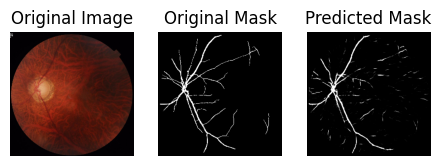

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


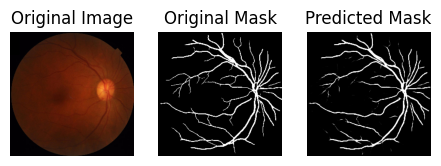

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


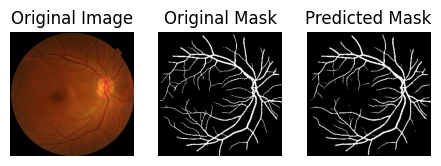

60/60 ━━━━━━━━━━━━━━━━━━━━ 40s 508ms/step - accuracy: 0.9726 - dice_coef: 0.8359 - loss: 0.2318 - val_accuracy: 0.9726 - val_dice_coef: 0.8392 - val_loss: 0.2318
Epoch 11/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 287ms/step - accuracy: 0.9735 - dice_coef: 0.8392 - loss: 0.2264 - val_accuracy: 0.9729 - val_dice_coef: 0.8387 - val_loss: 0.2284
Epoch 12/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 290ms/step - accuracy: 0.9732 - dice_coef: 0.8421 - loss: 0.2230 - val_accuracy: 0.9735 - val_dice_coef: 0.8421 - val_loss: 0.2215
Epoch 13/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9732 - dice_coef: 0.8437 - loss: 0.2206 - val_accuracy: 0.9730 - val_dice_coef: 0.8432 - val_loss: 0.2198
Epoch 14/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 288ms/step - accuracy: 0.9739 - dice_coef: 0.8443 - loss: 0.2185 - val_accuracy: 0.9735 - val_dice_coef: 0.8466 - val_loss: 0.2146
Epoch 15/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 289ms/step - accuracy: 0.9744 - dice_coef: 0.8519 - loss: 0.2087 - val_accuracy: 0.9738 - val_

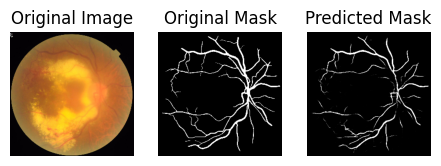

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


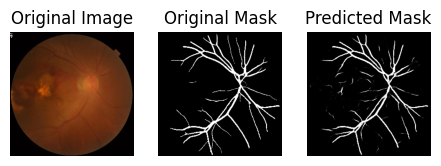

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


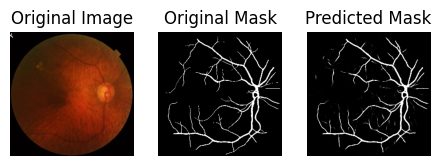

60/60 ━━━━━━━━━━━━━━━━━━━━ 36s 429ms/step - accuracy: 0.9745 - dice_coef: 0.8540 - loss: 0.2067 - val_accuracy: 0.9746 - val_dice_coef: 0.8542 - val_loss: 0.2040
Epoch 21/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 289ms/step - accuracy: 0.9753 - dice_coef: 0.8587 - loss: 0.2003 - val_accuracy: 0.9754 - val_dice_coef: 0.8589 - val_loss: 0.1994
Epoch 22/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 288ms/step - accuracy: 0.9752 - dice_coef: 0.8581 - loss: 0.2009 - val_accuracy: 0.9748 - val_dice_coef: 0.8588 - val_loss: 0.2035
Epoch 23/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9754 - dice_coef: 0.8632 - loss: 0.1945 - val_accuracy: 0.9753 - val_dice_coef: 0.8587 - val_loss: 0.2030
Epoch 24/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 288ms/step - accuracy: 0.9755 - dice_coef: 0.8665 - loss: 0.1900 - val_accuracy: 0.9754 - val_dice_coef: 0.8558 - val_loss: 0.2013
Epoch 25/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 287ms/step - accuracy: 0.9757 - dice_coef: 0.8645 - loss: 0.1915 - val_accuracy: 0.9740 - val_

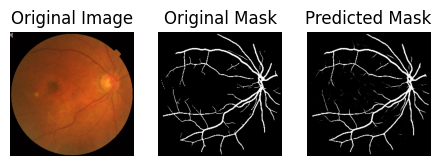

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


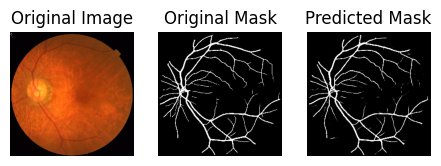

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


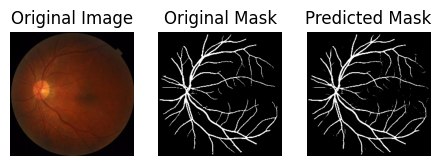

60/60 ━━━━━━━━━━━━━━━━━━━━ 35s 429ms/step - accuracy: 0.9758 - dice_coef: 0.8669 - loss: 0.1895 - val_accuracy: 0.9755 - val_dice_coef: 0.8617 - val_loss: 0.1935
Epoch 31/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 291ms/step - accuracy: 0.9764 - dice_coef: 0.8693 - loss: 0.1851 - val_accuracy: 0.9759 - val_dice_coef: 0.8650 - val_loss: 0.1908
Epoch 32/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 288ms/step - accuracy: 0.9761 - dice_coef: 0.8696 - loss: 0.1862 - val_accuracy: 0.9755 - val_dice_coef: 0.8641 - val_loss: 0.1928
Epoch 33/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9771 - dice_coef: 0.8692 - loss: 0.1840 - val_accuracy: 0.9756 - val_dice_coef: 0.8667 - val_loss: 0.1911
Epoch 34/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - accuracy: 0.9766 - dice_coef: 0.8721 - loss: 0.1829 - val_accuracy: 0.9750 - val_dice_coef: 0.8634 - val_loss: 0.1975
Epoch 35/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 291ms/step - accuracy: 0.9762 - dice_coef: 0.8680 - loss: 0.1889 - val_accuracy: 0.9760 - val_

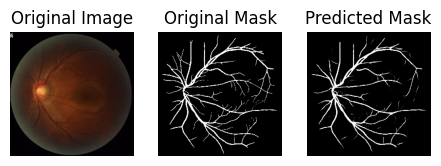

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


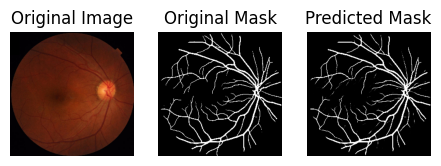

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


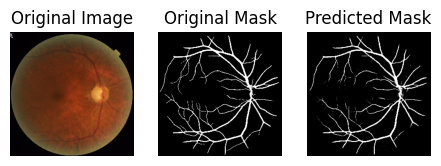

60/60 ━━━━━━━━━━━━━━━━━━━━ 36s 434ms/step - accuracy: 0.9770 - dice_coef: 0.8751 - loss: 0.1776 - val_accuracy: 0.9758 - val_dice_coef: 0.8652 - val_loss: 0.1973
Epoch 41/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9774 - dice_coef: 0.8765 - loss: 0.1745 - val_accuracy: 0.9752 - val_dice_coef: 0.8681 - val_loss: 0.1932
Epoch 42/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 291ms/step - accuracy: 0.9773 - dice_coef: 0.8773 - loss: 0.1738 - val_accuracy: 0.9764 - val_dice_coef: 0.8727 - val_loss: 0.1839
Epoch 43/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9763 - dice_coef: 0.8735 - loss: 0.1840 - val_accuracy: 0.9764 - val_dice_coef: 0.8695 - val_loss: 0.1865
Epoch 44/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9768 - dice_coef: 0.8776 - loss: 0.1755 - val_accuracy: 0.9758 - val_dice_coef: 0.8642 - val_loss: 0.1904
Epoch 45/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9771 - dice_coef: 0.8784 - loss: 0.1747 - val_accuracy: 0.9764 - val_

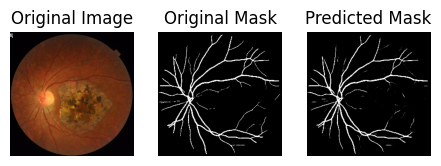

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


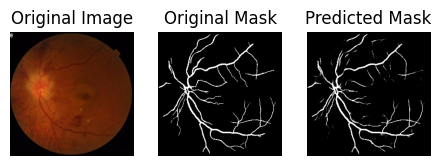

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


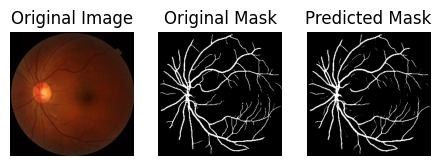

60/60 ━━━━━━━━━━━━━━━━━━━━ 36s 431ms/step - accuracy: 0.9780 - dice_coef: 0.8794 - loss: 0.1711 - val_accuracy: 0.9768 - val_dice_coef: 0.8730 - val_loss: 0.1827
Epoch 51/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - accuracy: 0.9778 - dice_coef: 0.8816 - loss: 0.1689 - val_accuracy: 0.9765 - val_dice_coef: 0.8707 - val_loss: 0.1824
Epoch 52/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 287ms/step - accuracy: 0.9774 - dice_coef: 0.8772 - loss: 0.1764 - val_accuracy: 0.9765 - val_dice_coef: 0.8673 - val_loss: 0.1850
Epoch 53/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9770 - dice_coef: 0.8777 - loss: 0.1777 - val_accuracy: 0.9762 - val_dice_coef: 0.8678 - val_loss: 0.1890
Epoch 54/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9782 - dice_coef: 0.8817 - loss: 0.1680 - val_accuracy: 0.9757 - val_dice_coef: 0.8701 - val_loss: 0.1916
Epoch 55/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9781 - dice_coef: 0.8825 - loss: 0.1672 - val_accuracy: 0.9766 - val_

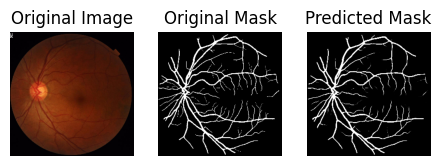

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


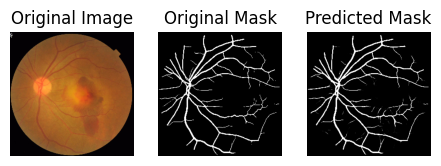

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


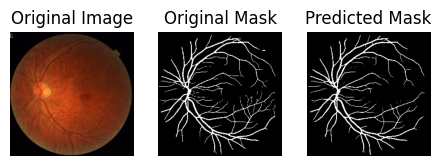

60/60 ━━━━━━━━━━━━━━━━━━━━ 35s 427ms/step - accuracy: 0.9780 - dice_coef: 0.8854 - loss: 0.1645 - val_accuracy: 0.9766 - val_dice_coef: 0.8770 - val_loss: 0.1830
Epoch 61/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 290ms/step - accuracy: 0.9780 - dice_coef: 0.8855 - loss: 0.1645 - val_accuracy: 0.9768 - val_dice_coef: 0.8764 - val_loss: 0.1787
Epoch 62/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 291ms/step - accuracy: 0.9782 - dice_coef: 0.8853 - loss: 0.1643 - val_accuracy: 0.9767 - val_dice_coef: 0.8707 - val_loss: 0.1825
Epoch 63/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9776 - dice_coef: 0.8798 - loss: 0.1741 - val_accuracy: 0.9767 - val_dice_coef: 0.8780 - val_loss: 0.1796
Epoch 64/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 283ms/step - accuracy: 0.9780 - dice_coef: 0.8832 - loss: 0.1674 - val_accuracy: 0.9765 - val_dice_coef: 0.8698 - val_loss: 0.1896
Epoch 65/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9783 - dice_coef: 0.8867 - loss: 0.1621 - val_accuracy: 0.9766 - val_

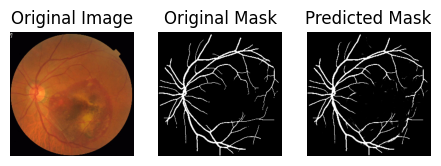

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


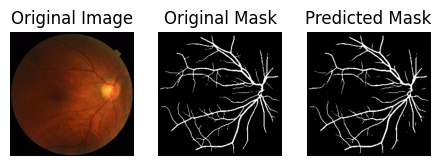

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


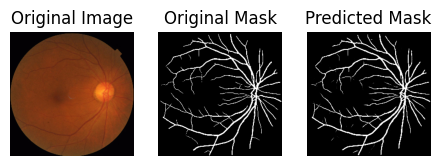

60/60 ━━━━━━━━━━━━━━━━━━━━ 35s 427ms/step - accuracy: 0.9782 - dice_coef: 0.8870 - loss: 0.1622 - val_accuracy: 0.9765 - val_dice_coef: 0.8778 - val_loss: 0.1831
Epoch 71/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - accuracy: 0.9789 - dice_coef: 0.8917 - loss: 0.1550 - val_accuracy: 0.9768 - val_dice_coef: 0.8785 - val_loss: 0.1818
Epoch 72/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9784 - dice_coef: 0.8901 - loss: 0.1579 - val_accuracy: 0.9767 - val_dice_coef: 0.8731 - val_loss: 0.1824
Epoch 73/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9782 - dice_coef: 0.8870 - loss: 0.1623 - val_accuracy: 0.9759 - val_dice_coef: 0.8720 - val_loss: 0.1864
Epoch 74/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 283ms/step - accuracy: 0.9791 - dice_coef: 0.8914 - loss: 0.1545 - val_accuracy: 0.9766 - val_dice_coef: 0.8777 - val_loss: 0.1832
Epoch 75/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9784 - dice_coef: 0.8884 - loss: 0.1604 - val_accuracy: 0.9766 - val_

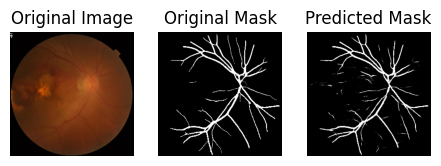

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


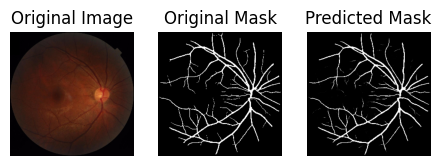

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


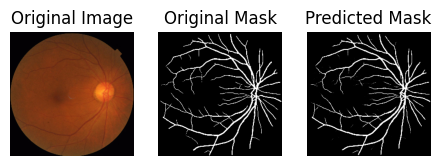

60/60 ━━━━━━━━━━━━━━━━━━━━ 35s 427ms/step - accuracy: 0.9785 - dice_coef: 0.8893 - loss: 0.1598 - val_accuracy: 0.9766 - val_dice_coef: 0.8713 - val_loss: 0.1864
Epoch 81/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - accuracy: 0.9788 - dice_coef: 0.8909 - loss: 0.1565 - val_accuracy: 0.9735 - val_dice_coef: 0.8610 - val_loss: 0.2071
Epoch 82/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9785 - dice_coef: 0.8868 - loss: 0.1620 - val_accuracy: 0.9756 - val_dice_coef: 0.8716 - val_loss: 0.1881
Epoch 83/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9788 - dice_coef: 0.8906 - loss: 0.1569 - val_accuracy: 0.9764 - val_dice_coef: 0.8769 - val_loss: 0.1812
Epoch 84/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - accuracy: 0.9788 - dice_coef: 0.8889 - loss: 0.1603 - val_accuracy: 0.9770 - val_dice_coef: 0.8760 - val_loss: 0.1812
Epoch 85/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9791 - dice_coef: 0.8923 - loss: 0.1542 - val_accuracy: 0.9769 - val_

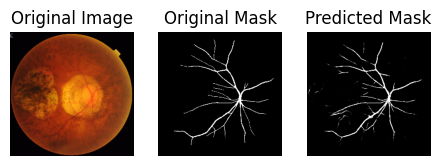

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


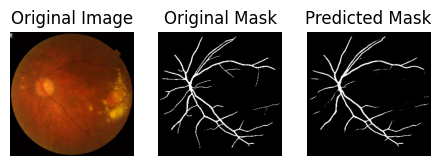

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


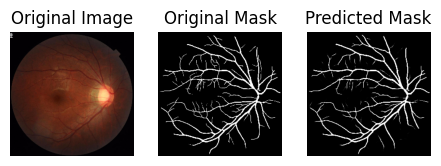

60/60 ━━━━━━━━━━━━━━━━━━━━ 35s 426ms/step - accuracy: 0.9786 - dice_coef: 0.8905 - loss: 0.1585 - val_accuracy: 0.9762 - val_dice_coef: 0.8714 - val_loss: 0.1867
Epoch 91/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9796 - dice_coef: 0.8961 - loss: 0.1482 - val_accuracy: 0.9767 - val_dice_coef: 0.8773 - val_loss: 0.1840
Epoch 92/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 286ms/step - accuracy: 0.9794 - dice_coef: 0.8954 - loss: 0.1499 - val_accuracy: 0.9764 - val_dice_coef: 0.8748 - val_loss: 0.1846
Epoch 93/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 285ms/step - accuracy: 0.9789 - dice_coef: 0.8899 - loss: 0.1590 - val_accuracy: 0.9763 - val_dice_coef: 0.8739 - val_loss: 0.1832
Epoch 94/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 289ms/step - accuracy: 0.9794 - dice_coef: 0.8959 - loss: 0.1493 - val_accuracy: 0.9771 - val_dice_coef: 0.8779 - val_loss: 0.1805
Epoch 95/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 27s 284ms/step - accuracy: 0.9791 - dice_coef: 0.8937 - loss: 0.1539 - val_accuracy: 0.9767 - val_

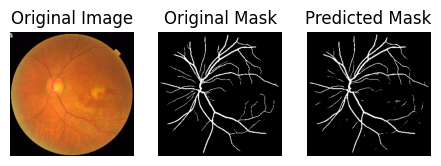

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


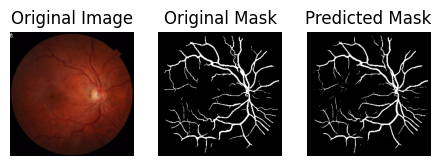

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


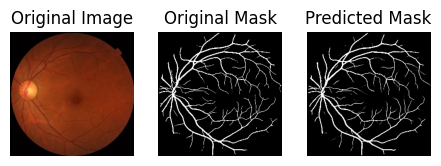

60/60 ━━━━━━━━━━━━━━━━━━━━ 35s 426ms/step - accuracy: 0.9793 - dice_coef: 0.8948 - loss: 0.1517 - val_accuracy: 0.9770 - val_dice_coef: 0.8770 - val_loss: 0.1794


In [8]:

import tensorflow.keras.backend as K

custom_objects = {'ConvBlock': ConvBlock}


checkpoint = ModelCheckpoint(
    '/content/drive/MyDrive/Proposed_model_Xception_LF.keras',
    monitor='val_accuracy',
    verbose=0,
    save_best_only=True,
    save_weights_only=False,
    mode='auto',
)
class ShowProgress(Callback):
    def on_epoch_end(self, epoch, logs=None):
        if (epoch+1)%10==0:
            show_images(val_dataset, model=self.model, explain=True, n_images=3, SIZE=(15,8))

history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    callbacks=[checkpoint,ShowProgress()],
    epochs=100
)

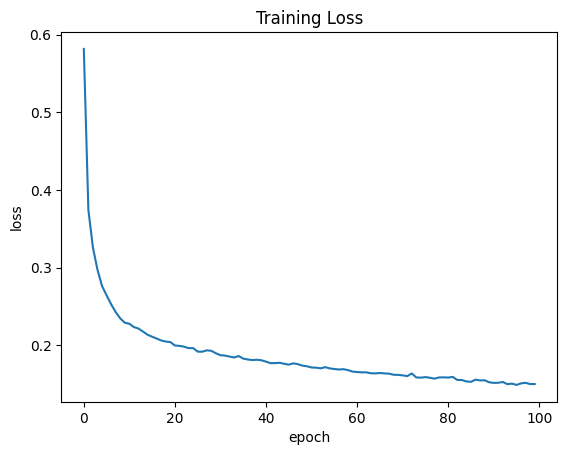

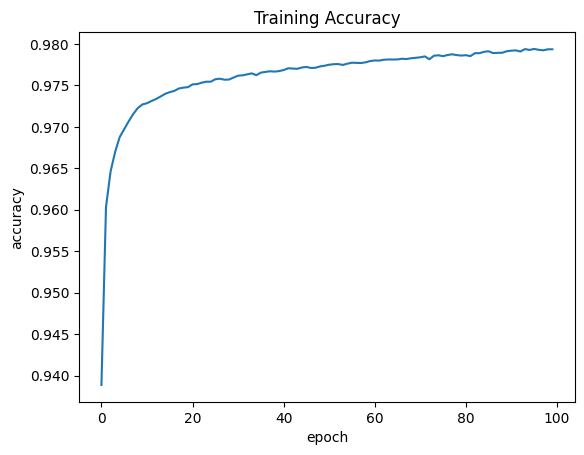

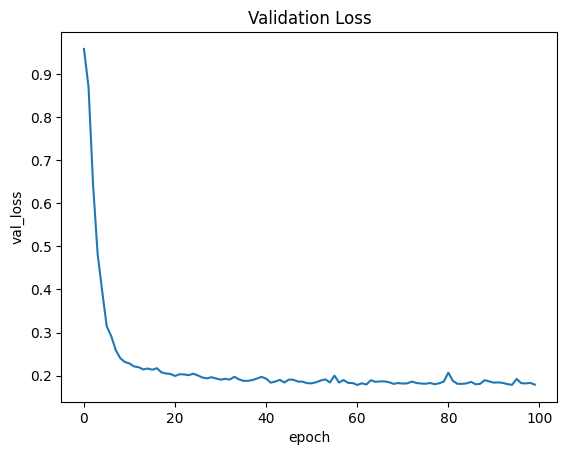

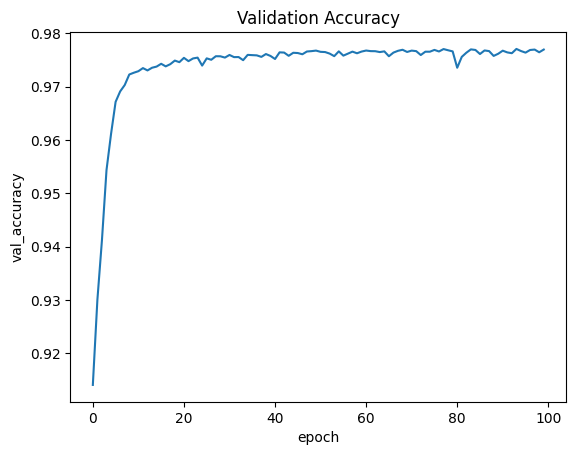

In [9]:
plt.plot(history.history["loss"])
plt.title("Training Loss")
plt.ylabel("loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["accuracy"])
plt.title("Training Accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_loss"])
plt.title("Validation Loss")
plt.ylabel("val_loss")
plt.xlabel("epoch")
plt.show()

plt.plot(history.history["val_accuracy"])
plt.title("Validation Accuracy")
plt.ylabel("val_accuracy")
plt.xlabel("epoch")
plt.show()

In [12]:
m1 = keras.models.load_model("/content/drive/MyDrive/Proposed_model_Xception_LF.keras", custom_objects={**custom_objects, 'dice_coef': dice_coef})
dice_score = m1.evaluate(val_dataset, verbose=0)
print("Val Dice Score:", dice_score[1])

Val Dice Score: 0.8777478933334351


In [14]:
import tensorflow as tf

IMAGE_SIZE = 256
BATCH_SIZE = 8

def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_png(image, channels=1)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for mask images
        image = tf.where(image >= 0.5, 1.0, 0.0)
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_png(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for RGB images

        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])

    return image

def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask

def data_generator(image_list, mask_list):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

test_dataset = data_generator(test_image_paths, test_mask_paths)

print("Test Dataset:", test_dataset)


Test Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(8, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(8, 256, 256, 1), dtype=tf.float32, name=None))>


In [16]:

def calculate_metrics(model, test_dataset):
    accuracy_scores = []
    dice_scores = []
    tp_scores = []
    tn_scores = []
    fp_scores = []
    fn_scores = []

    for image, mask in test_dataset:

        pred_mask = model.predict(image)


        mask = mask.numpy()

        pred_mask_binary = (pred_mask > 0.5).astype(np.float32)

        mask_flat = mask.flatten()
        pred_mask_flat = pred_mask_binary.flatten()

        # Calculate True Positives, True Negatives, False Positives, and False Negatives
        tp = np.sum(mask_flat * pred_mask_flat)
        tn = np.sum((1 - mask_flat) * (1 - pred_mask_flat))
        fp = np.sum((1 - mask_flat) * pred_mask_flat)
        fn = np.sum(mask_flat * (1 - pred_mask_flat))

        # Calculate accuracy, Dice score
        accuracy = (tp + tn) / (tp + tn + fp + fn)
        dice = (2.0 * tp) / (2.0 * tp + fp + fn)

        accuracy_scores.append(accuracy)
        dice_scores.append(dice)
        tp_scores.append(tp)
        tn_scores.append(tn)
        fp_scores.append(fp)
        fn_scores.append(fn)

    # Calculate and print average accuracy and Dice scores
    avg_accuracy = np.mean(accuracy_scores)
    avg_dice = np.mean(dice_scores)

    print(f"Average Accuracy: {avg_accuracy:.4f}")
    print(f"Average Dice Score: {avg_dice:.4f}")

    TP = np.mean(tp_scores)
    TN = np.mean(tn_scores)
    FP = np.mean(fp_scores)
    FN = np.mean(fn_scores)

    f1 = 2 * TP / (2 * TP + FP + FN)
    recall = TP/(FN+TP)
    precision = TP/(TP+FP)
    specificity = TN/(FP+TN)
    MCC = (TP*TN - FP*FN)/ np.sqrt((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN))

    print("Precision Score:", precision)
    print("Sensitivity/Recall Score:", recall)
    print("Specificity Score:", specificity)
    print("F1 Score:", f1)
    print("MCC :", MCC)

calculate_metrics(model, test_dataset)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Average Accuracy: 0.9824
Average Dice Score: 0.8721


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


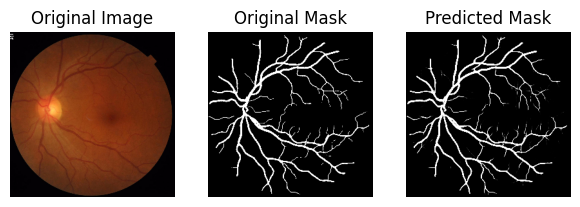

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


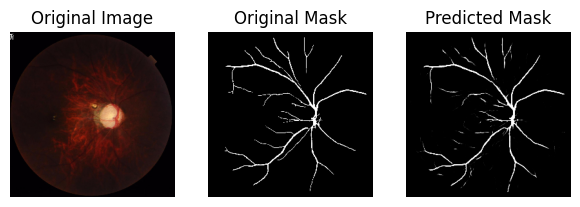

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


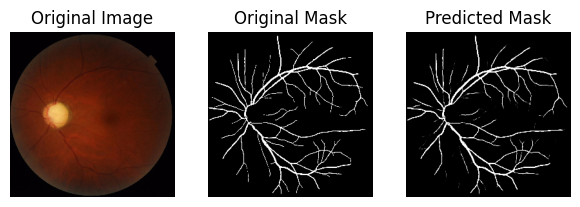

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


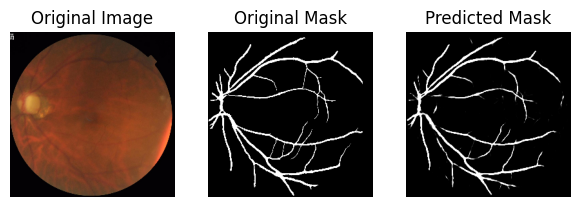

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


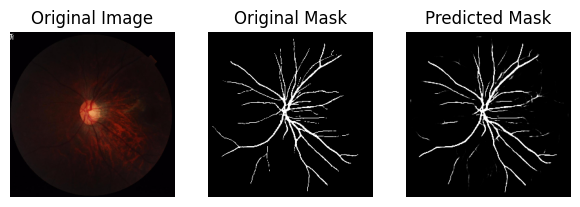

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


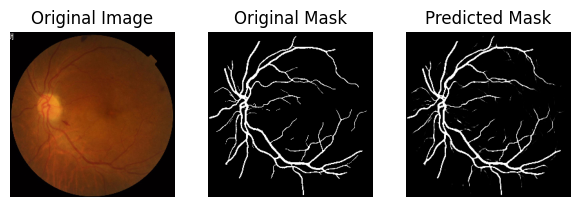

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


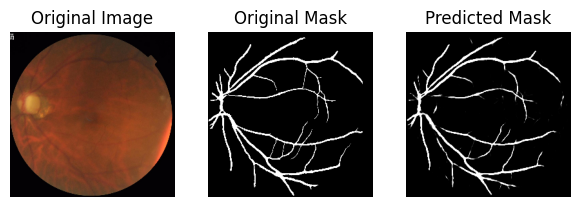

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


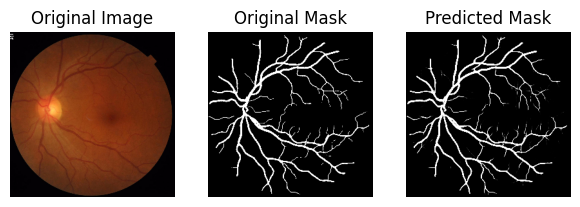

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


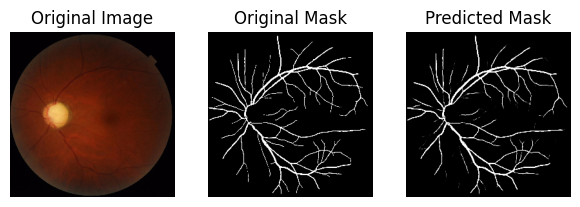

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


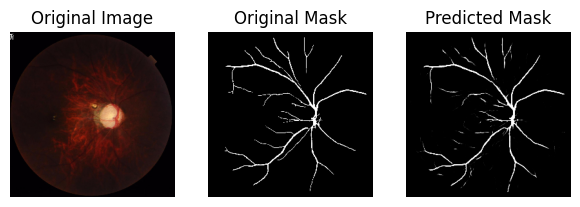

In [17]:
show_images(test_dataset, model=model, explain=True, n_images=10, SIZE=(20,8))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


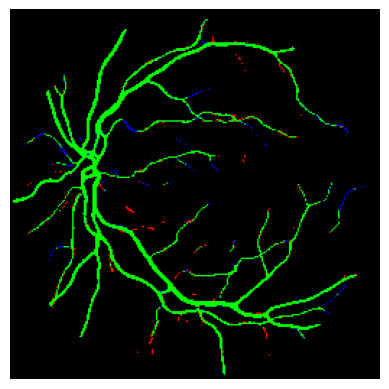

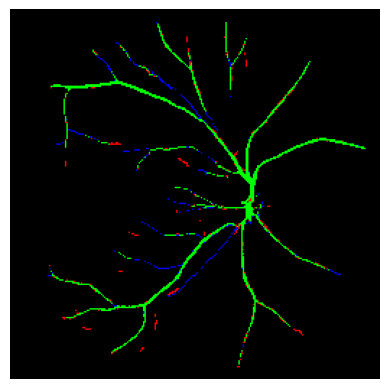

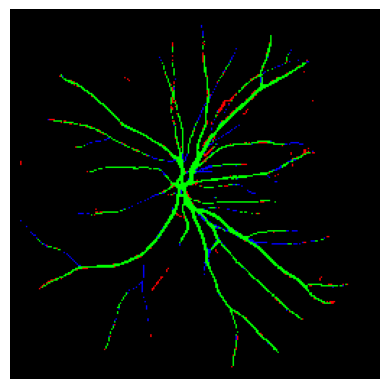

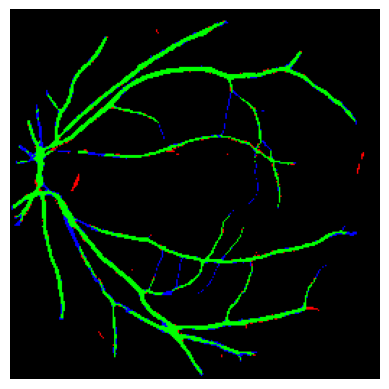

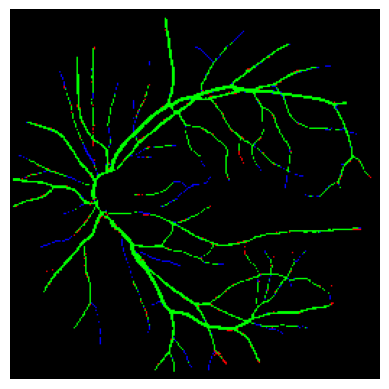

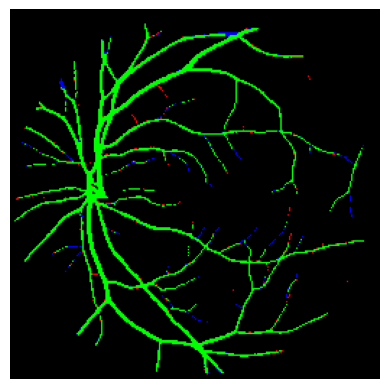

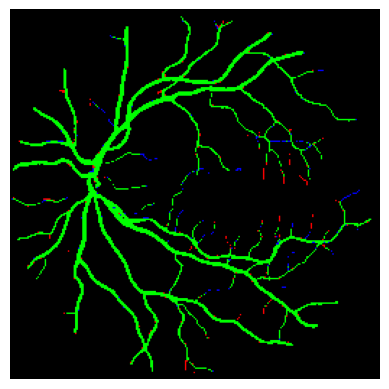

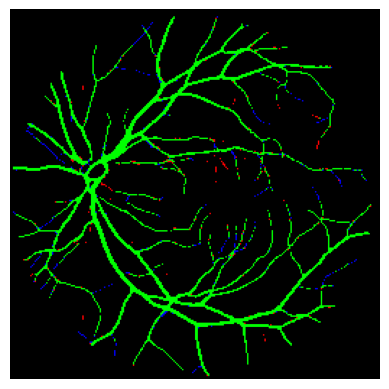

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


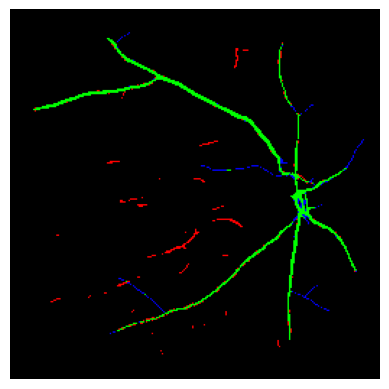

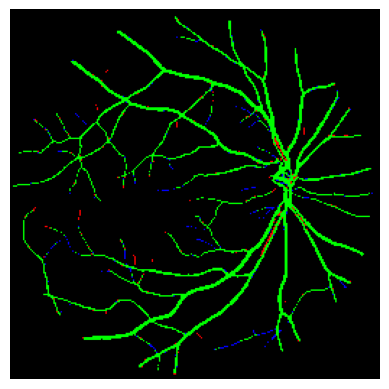

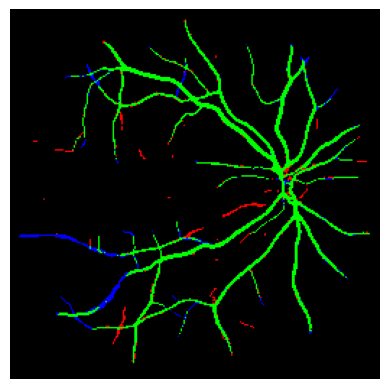

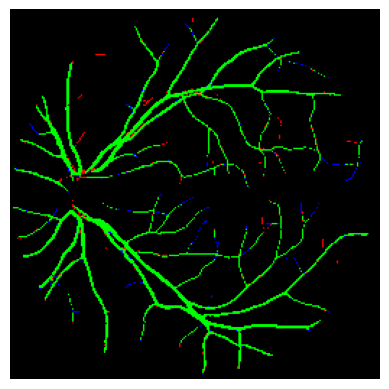

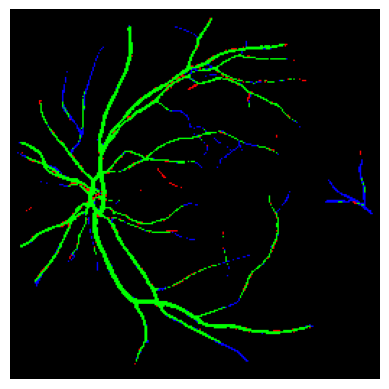

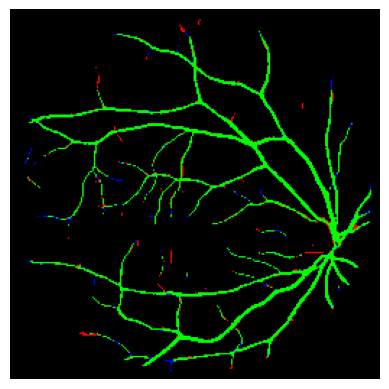

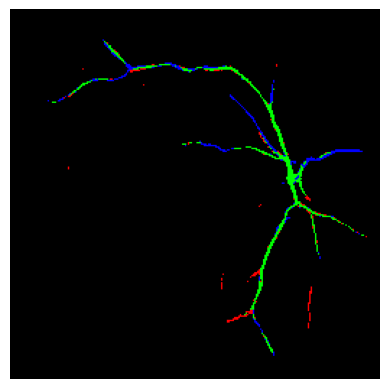

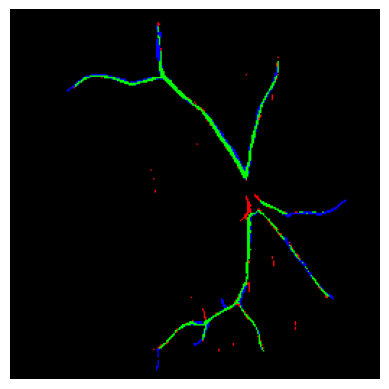

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


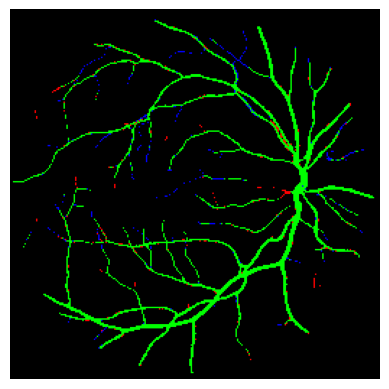

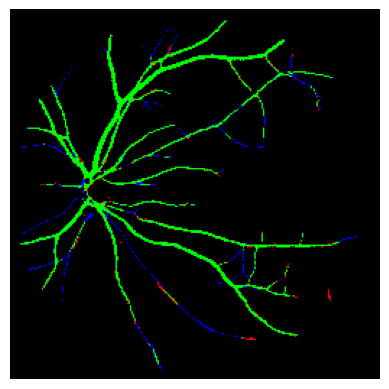

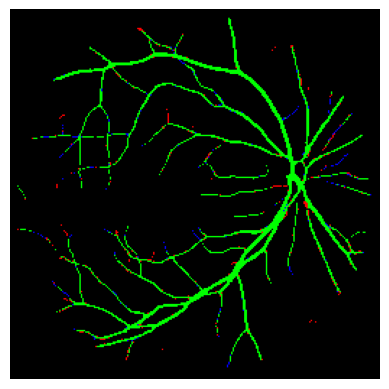

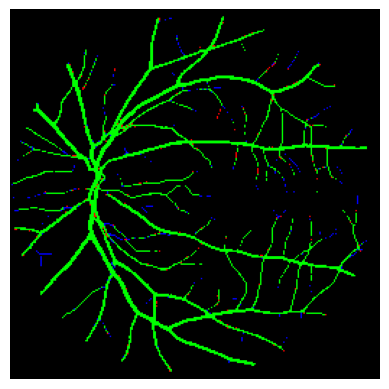

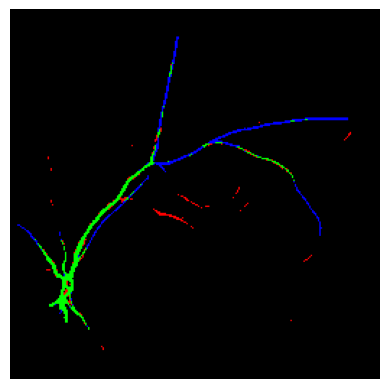

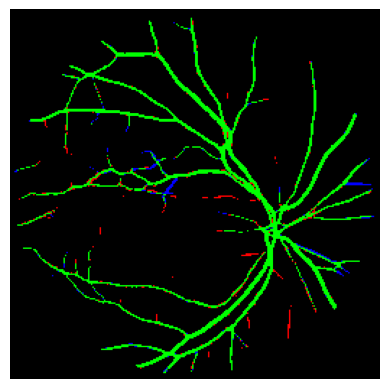

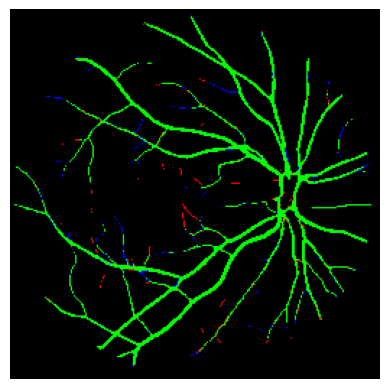

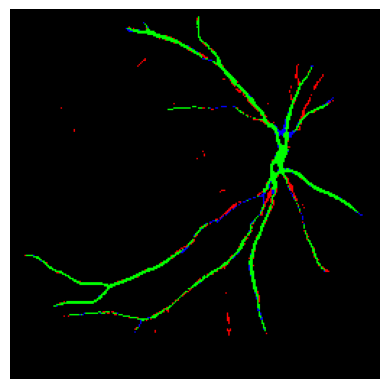

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


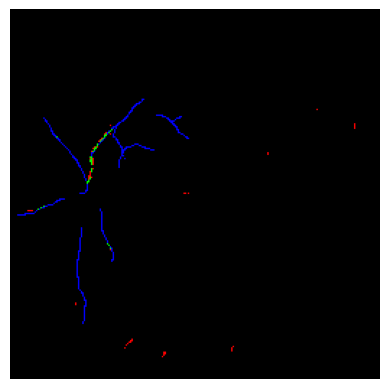

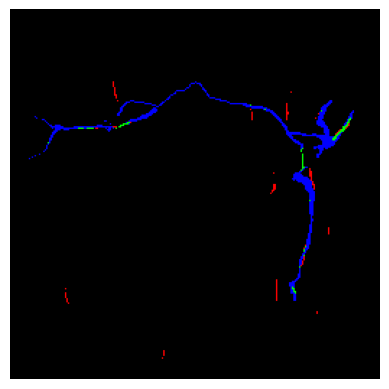

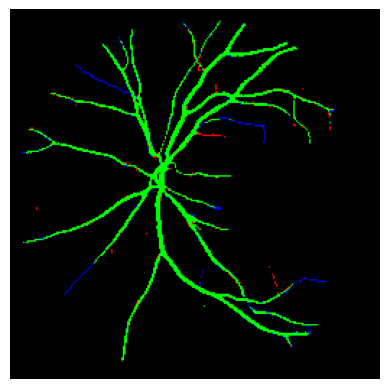

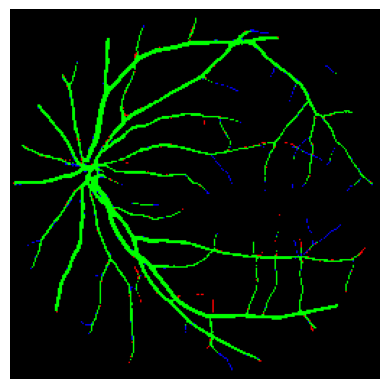

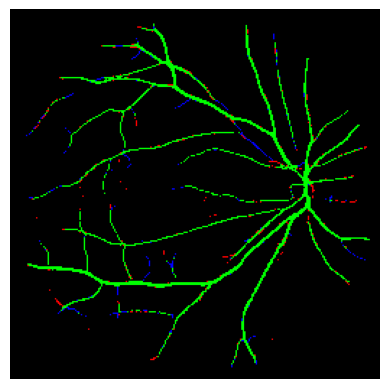

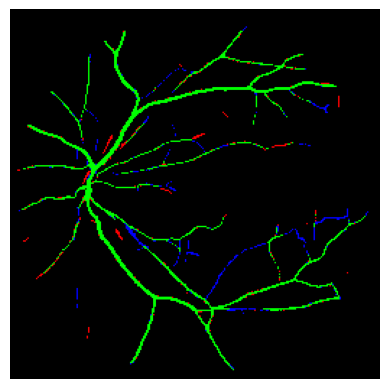

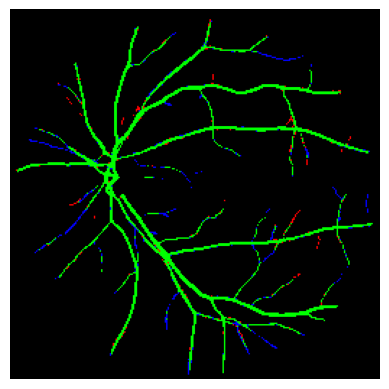

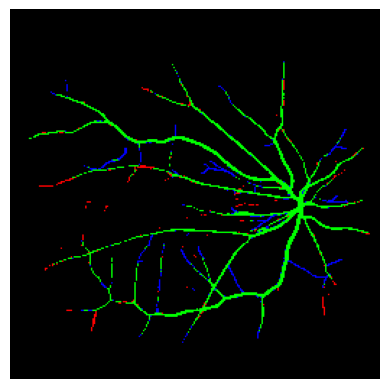

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


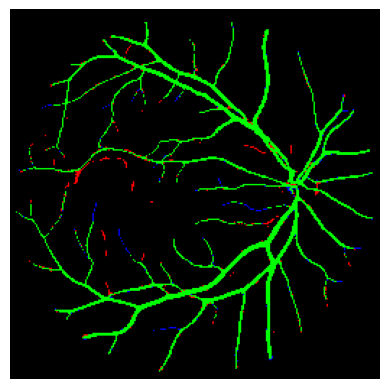

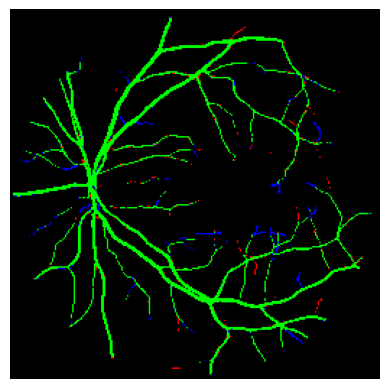

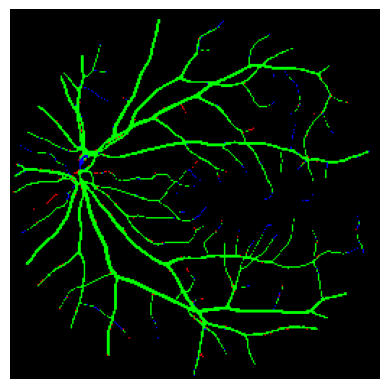

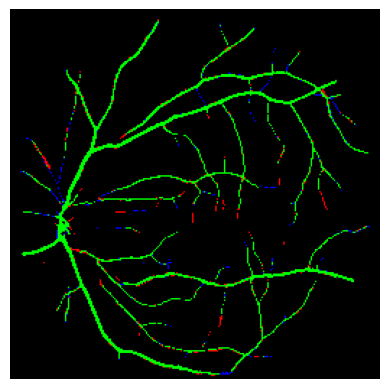

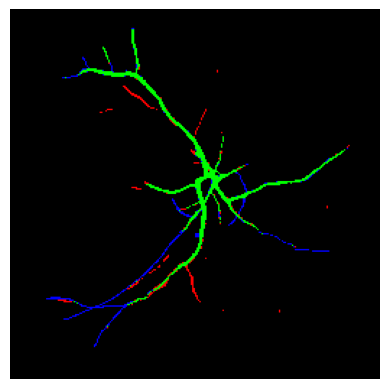

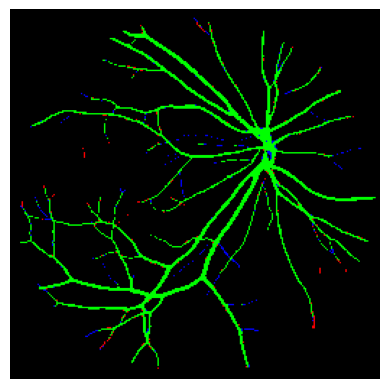

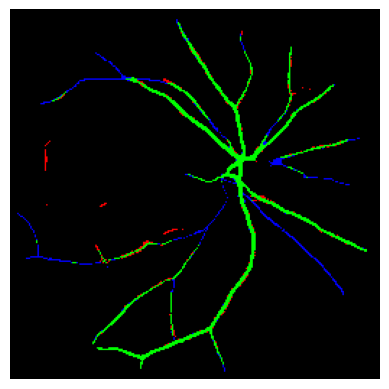

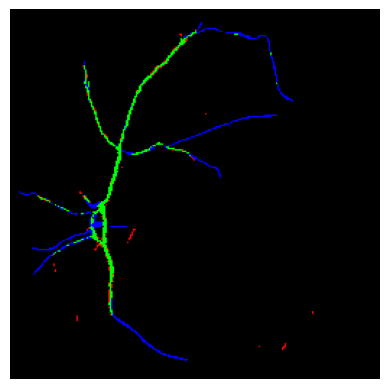

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


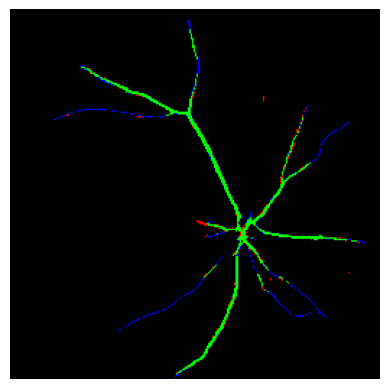

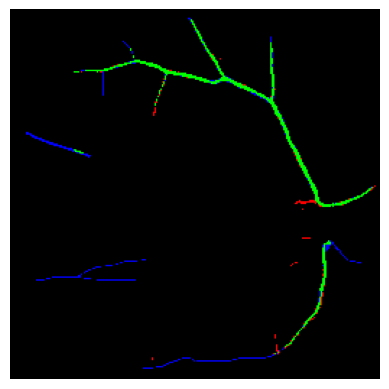

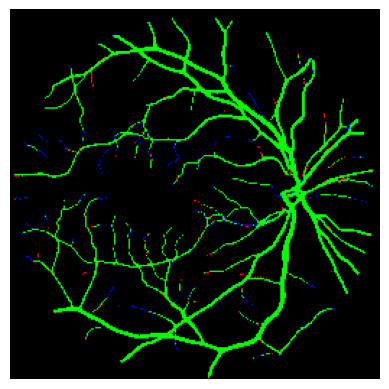

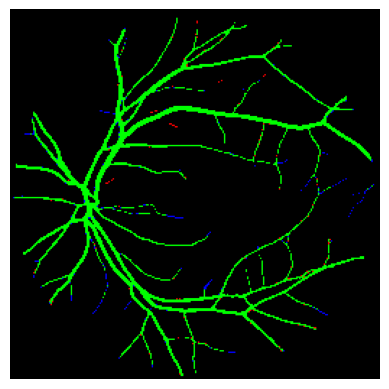

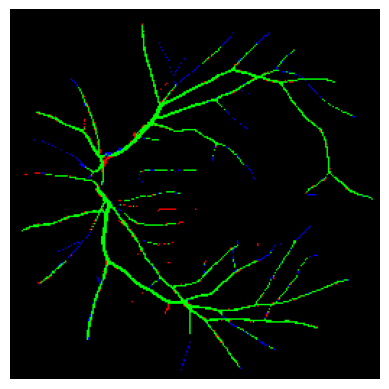

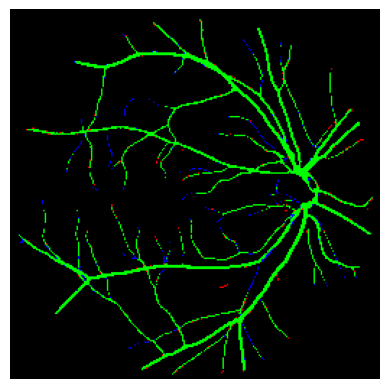

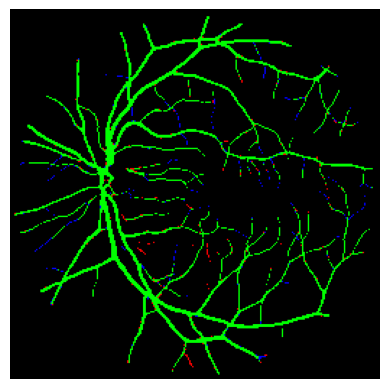

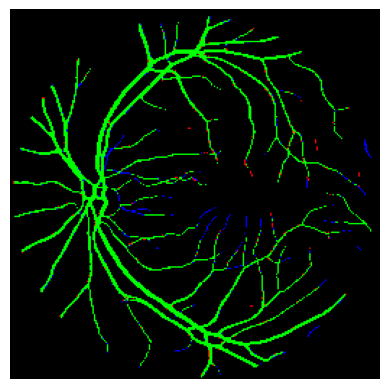

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


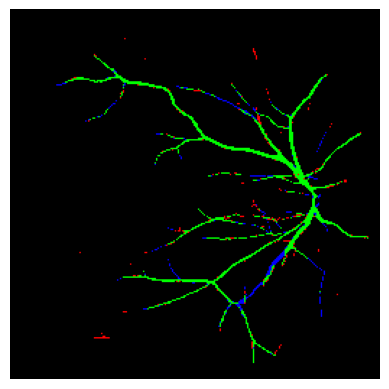

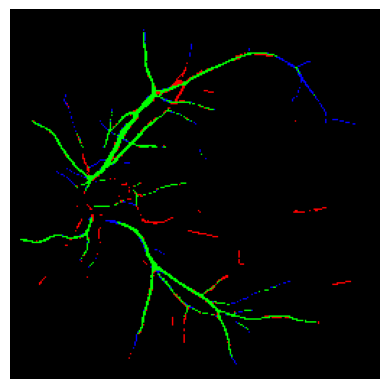

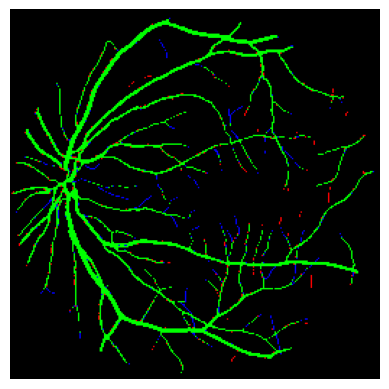

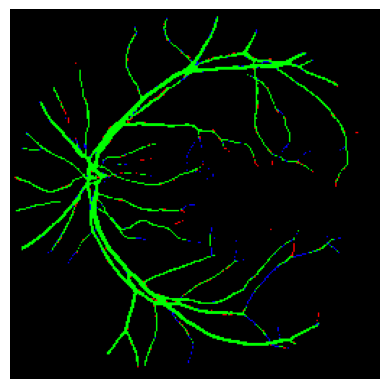

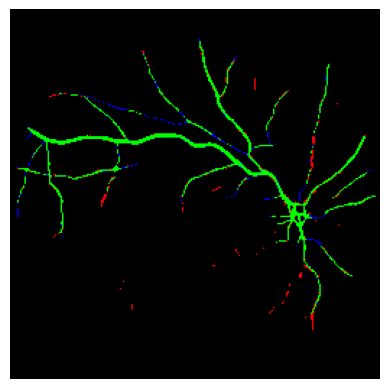

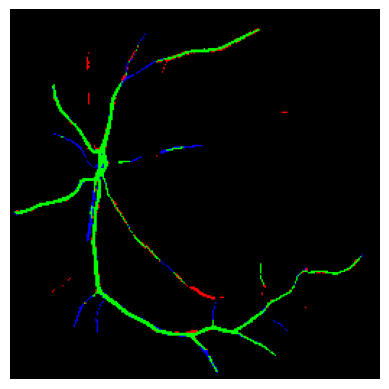

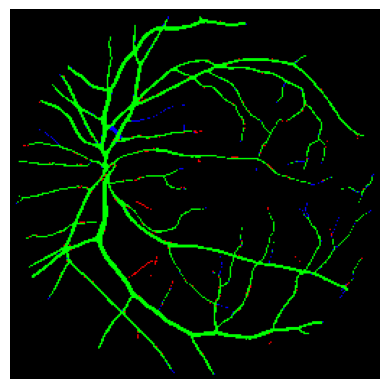

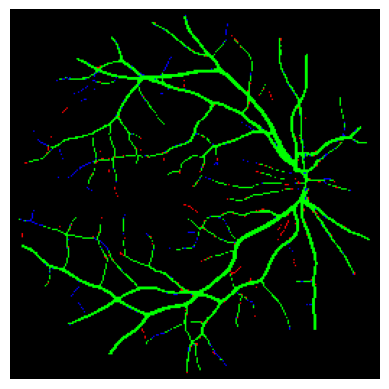

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


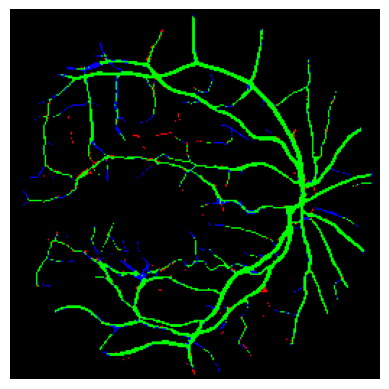

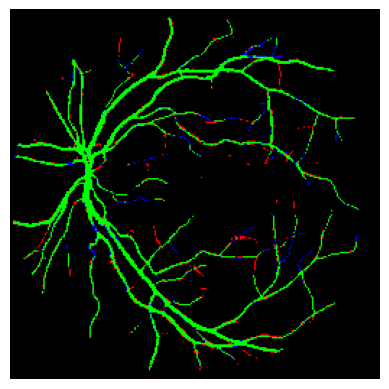

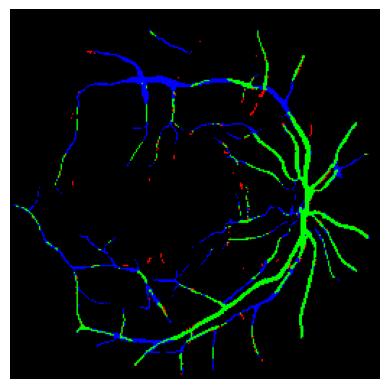

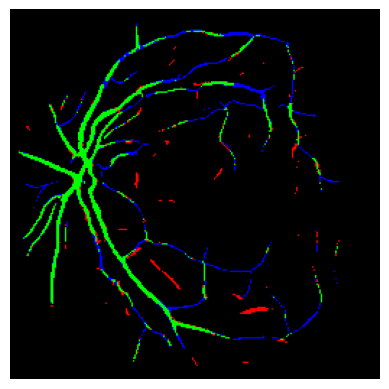

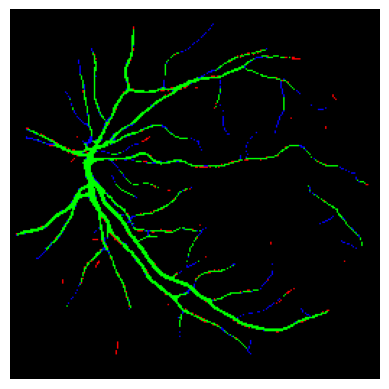

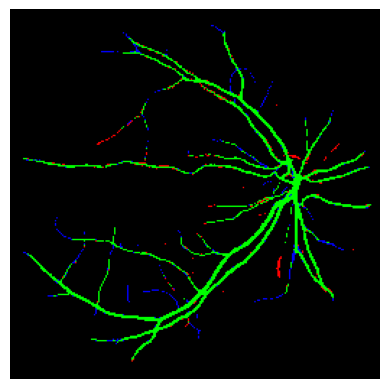

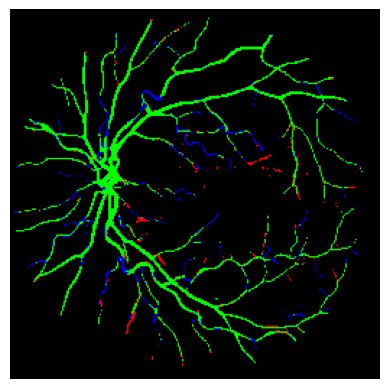

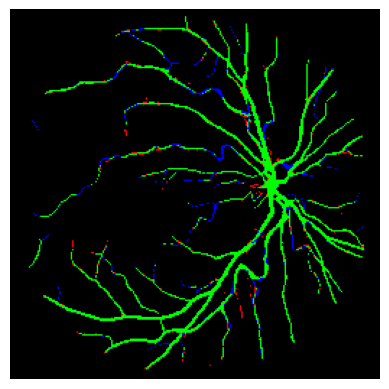

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


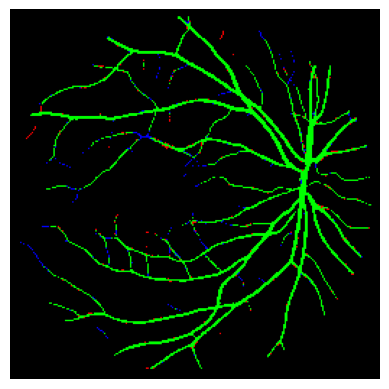

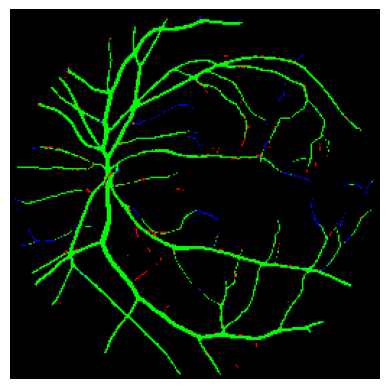

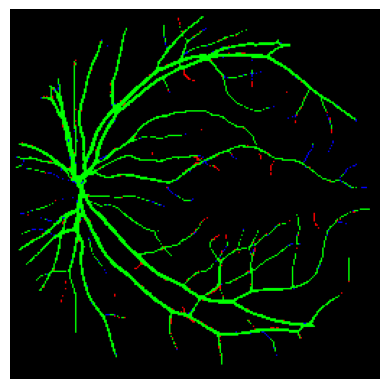

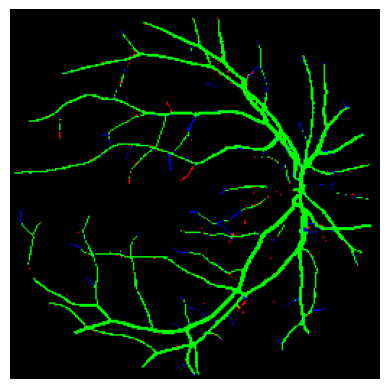

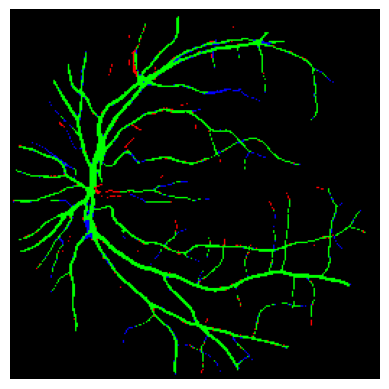

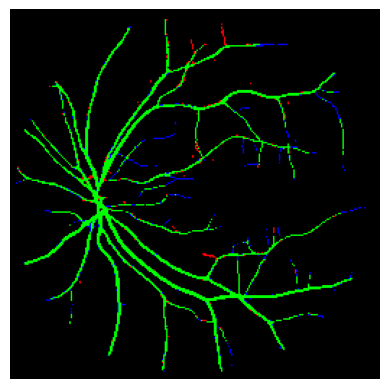

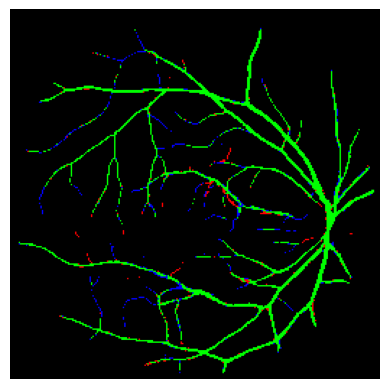

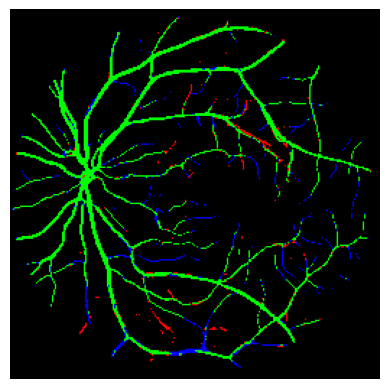

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


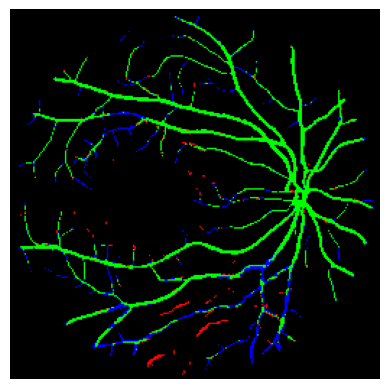

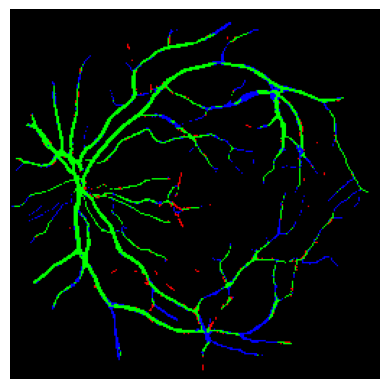

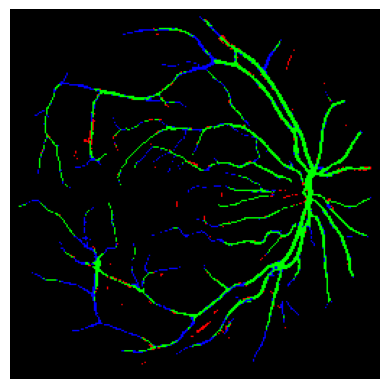

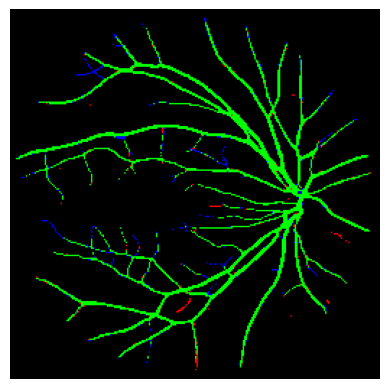

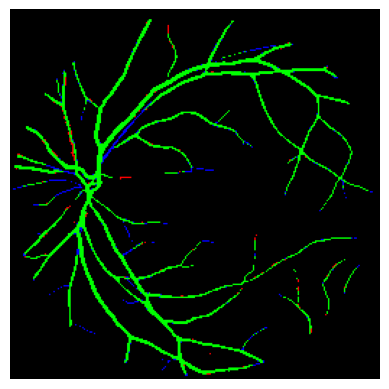

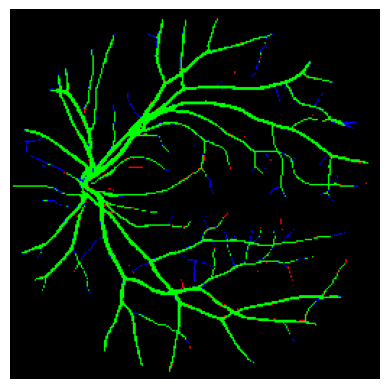

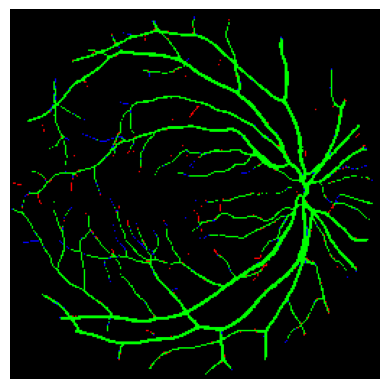

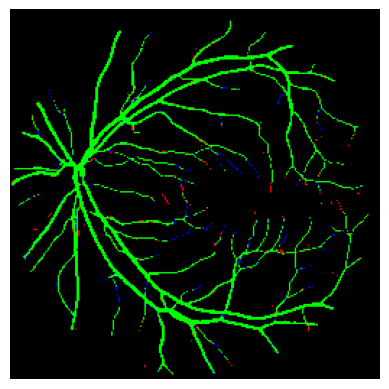

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


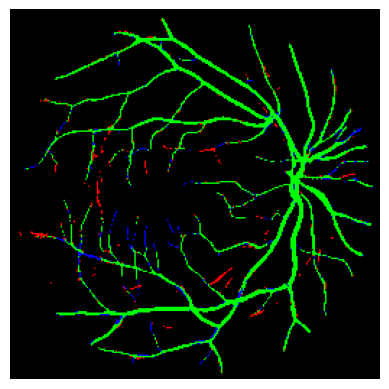

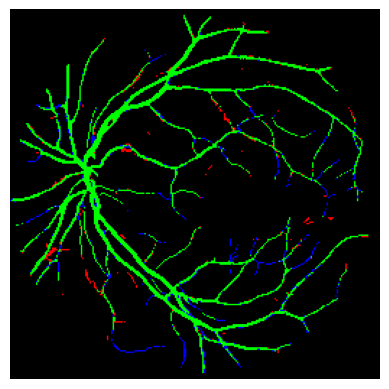

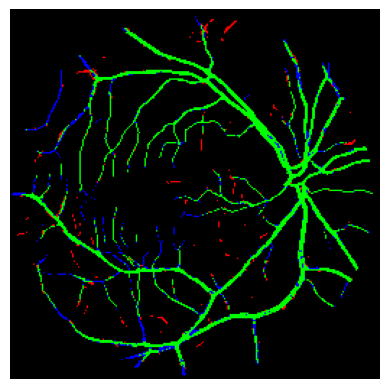

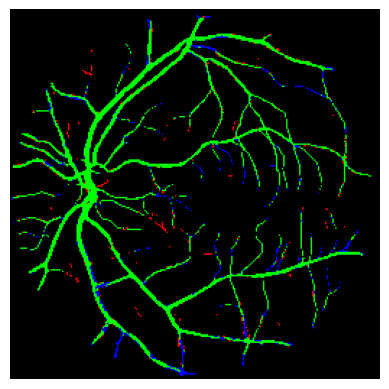

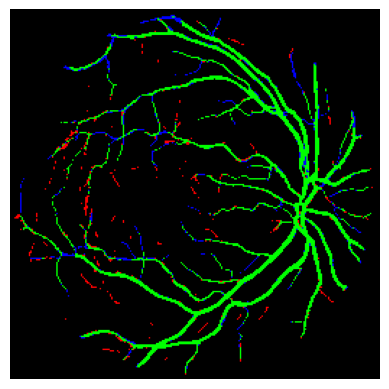

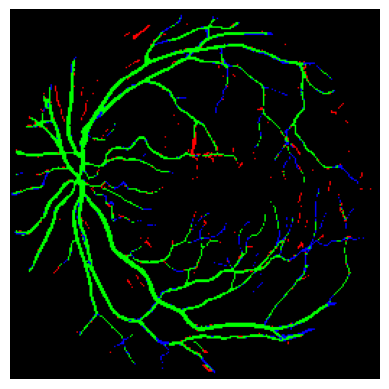

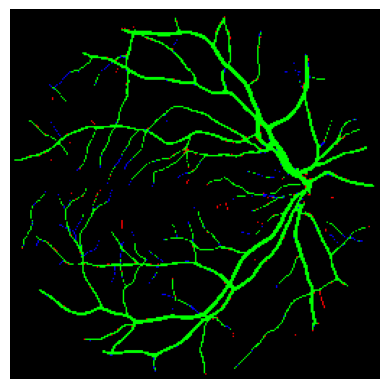

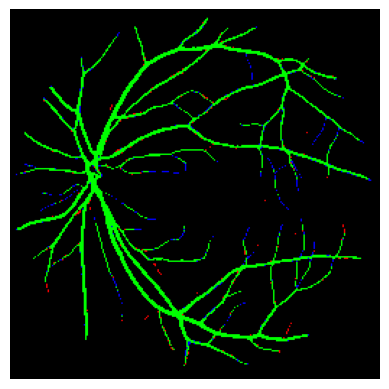

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


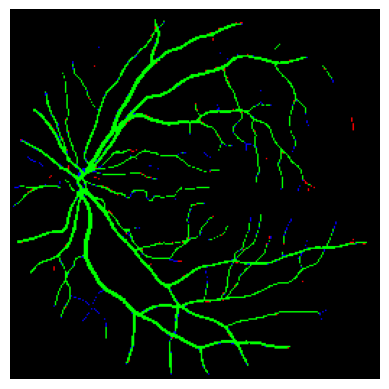

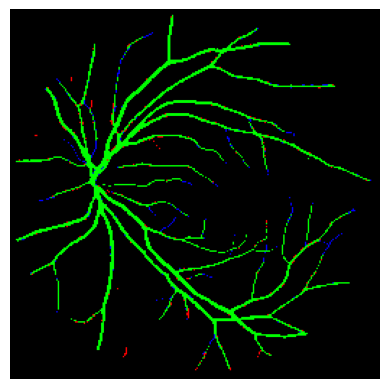

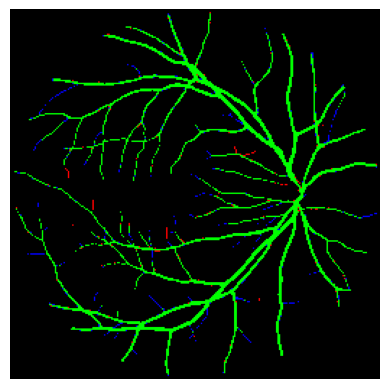

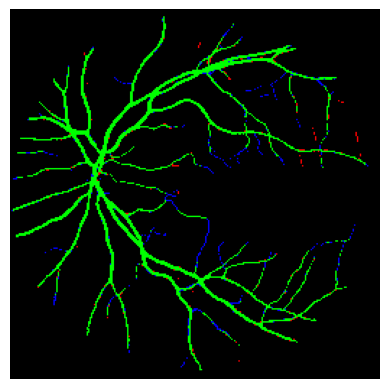

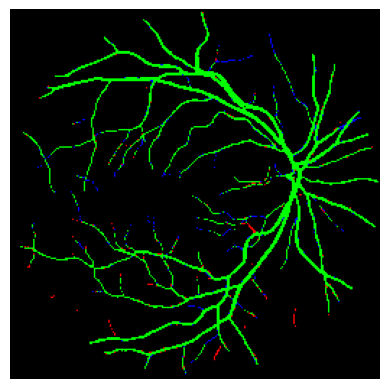

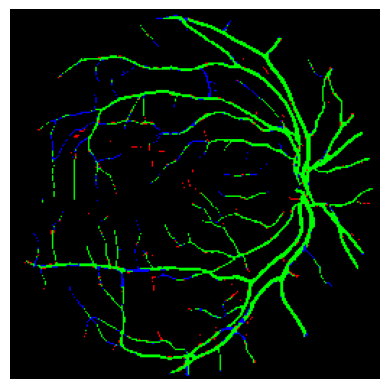

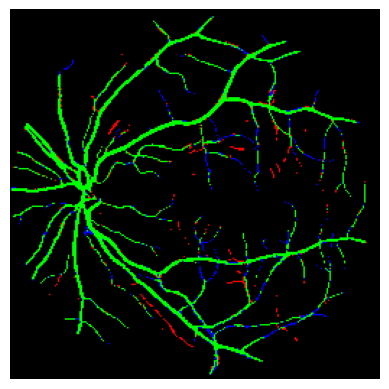

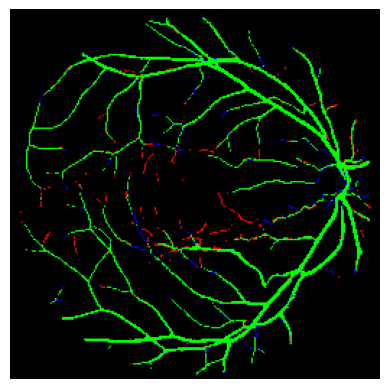

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


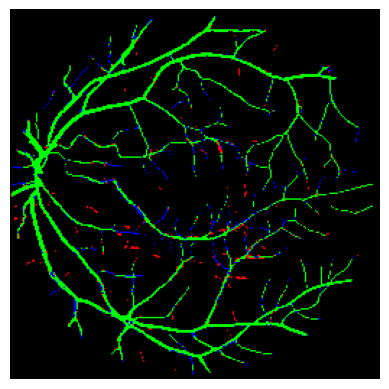

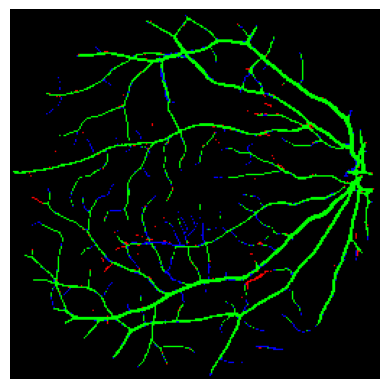

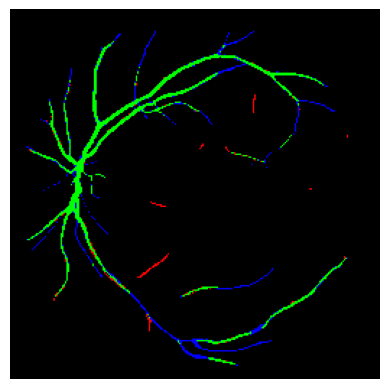

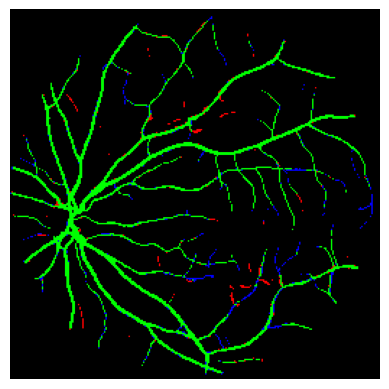

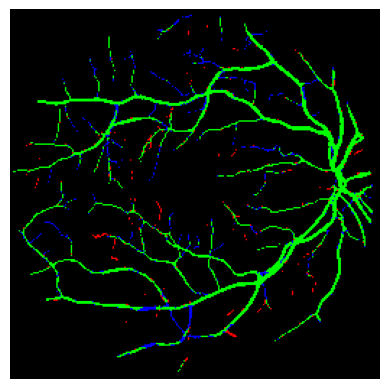

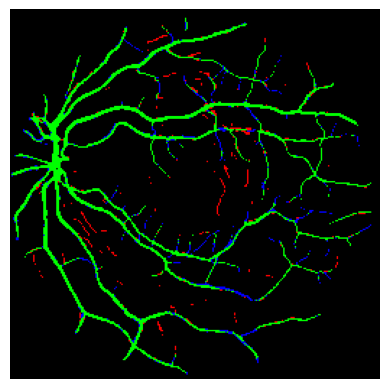

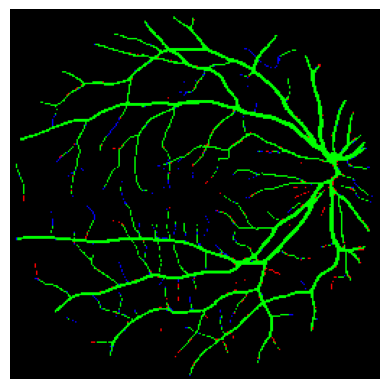

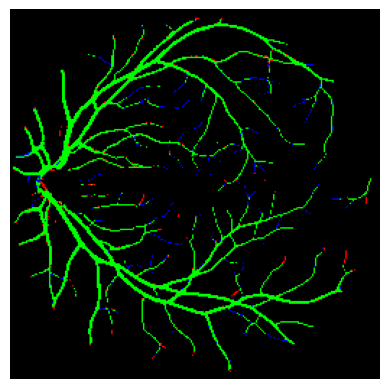

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


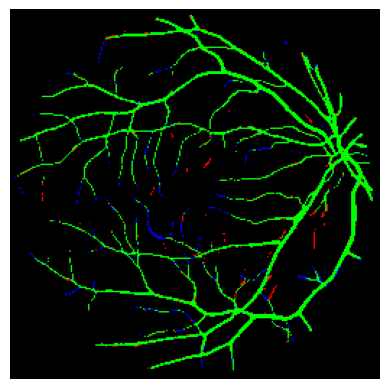

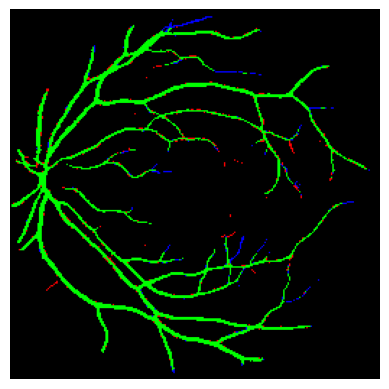

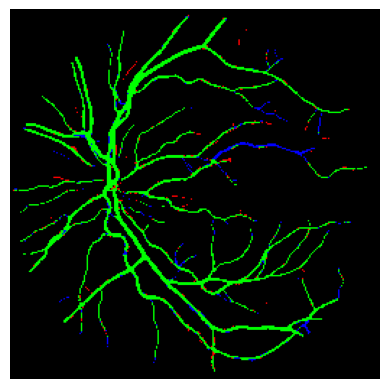

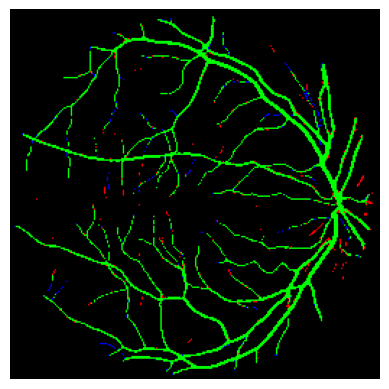

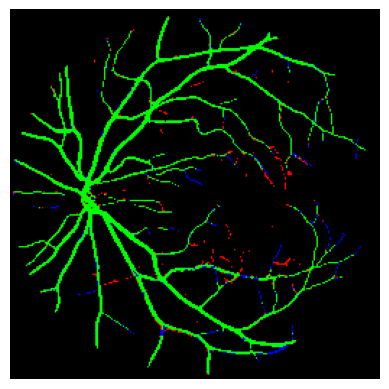

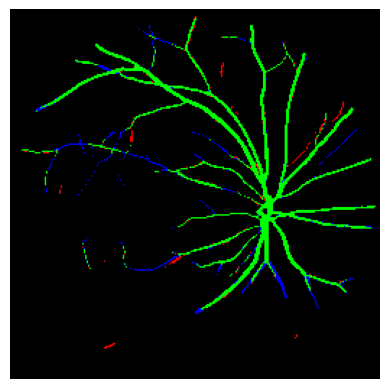

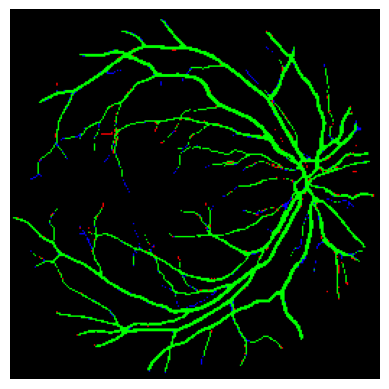

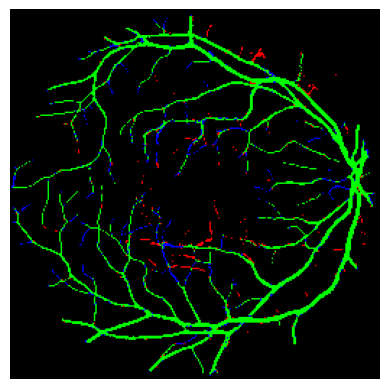

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


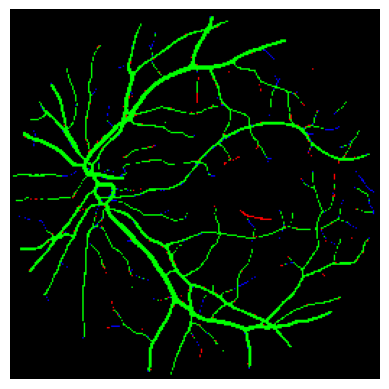

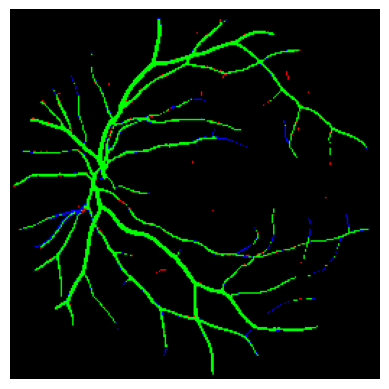

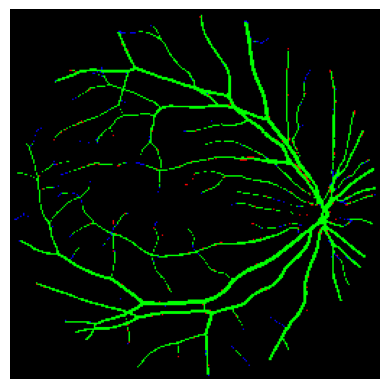

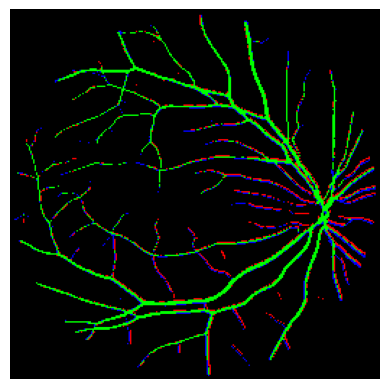

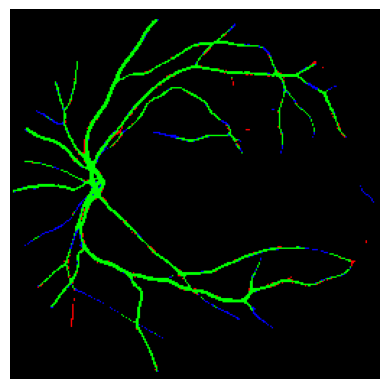

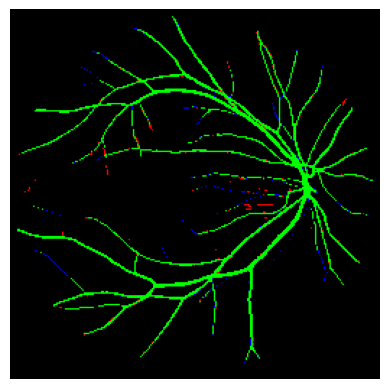

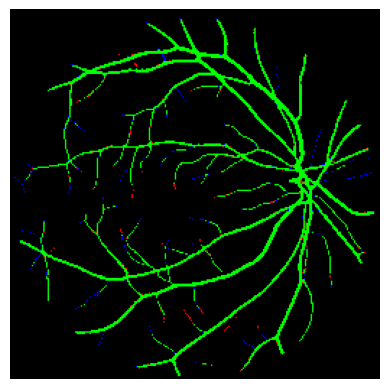

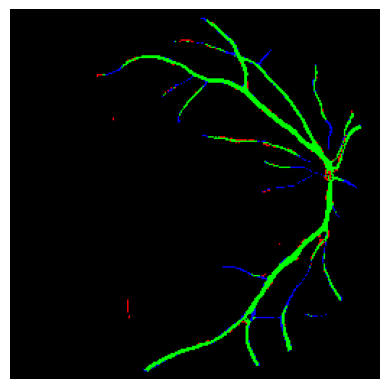

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


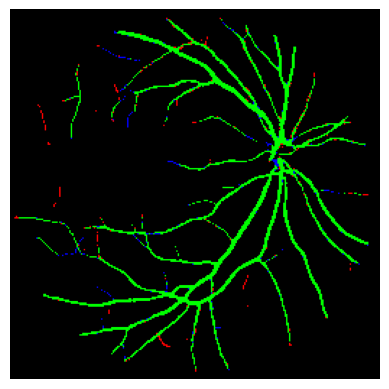

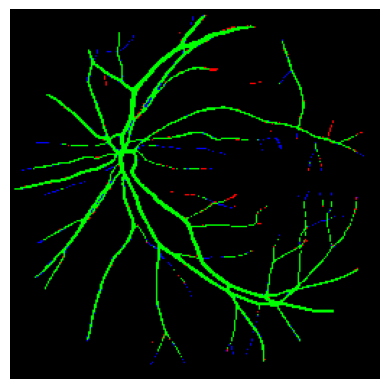

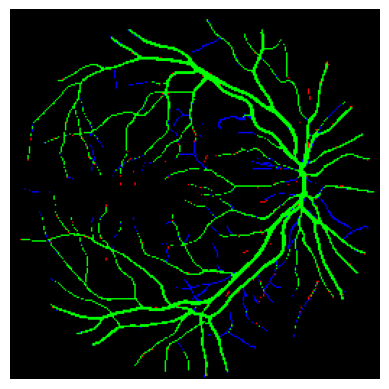

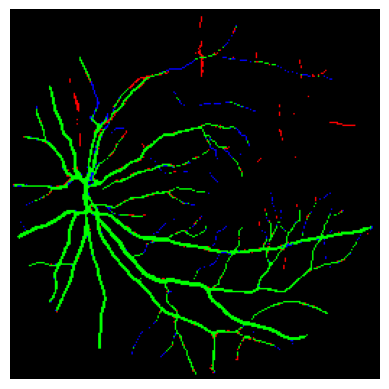

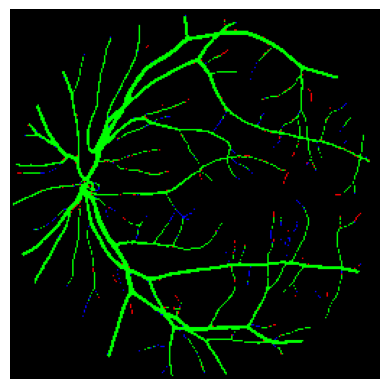

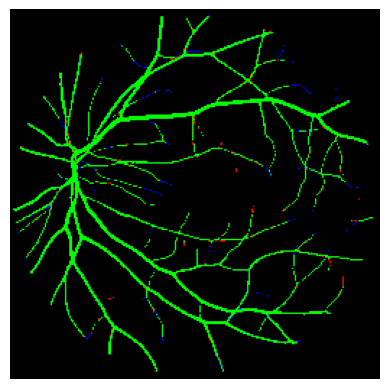

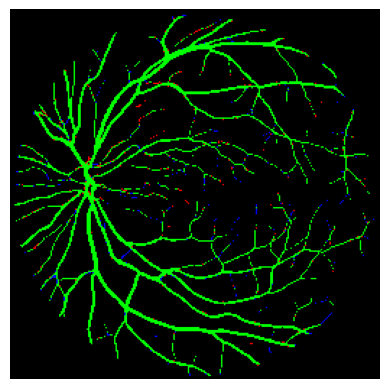

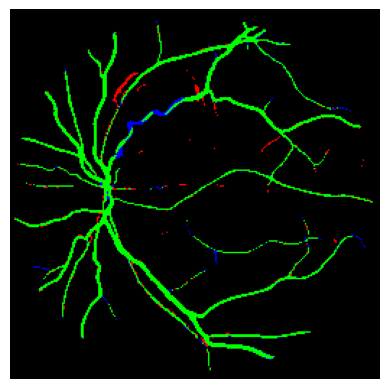

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


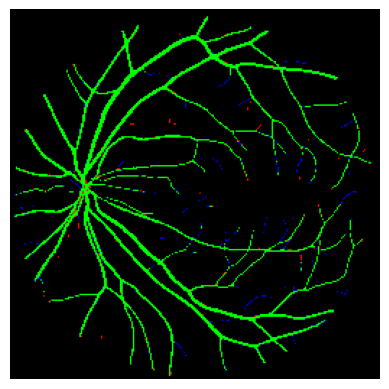

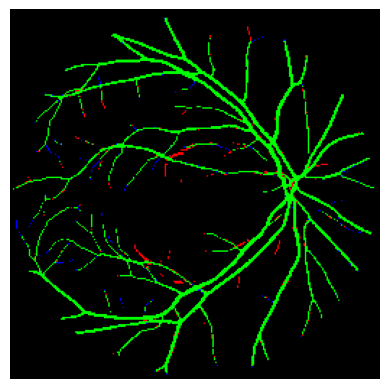

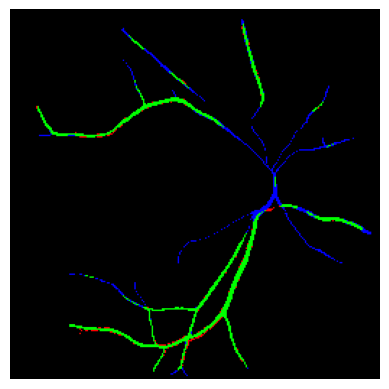

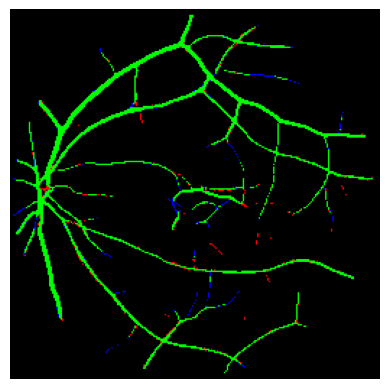

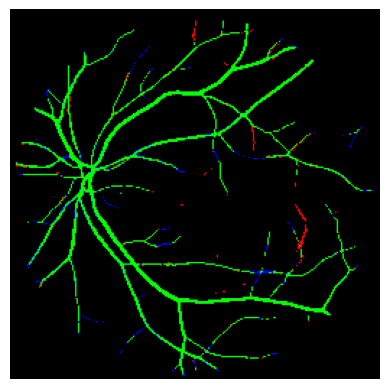

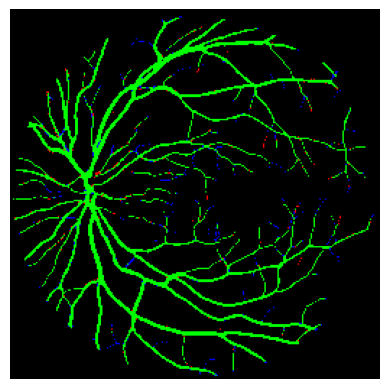

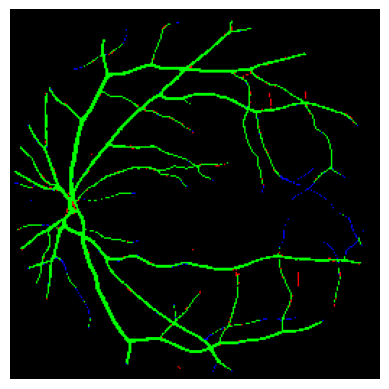

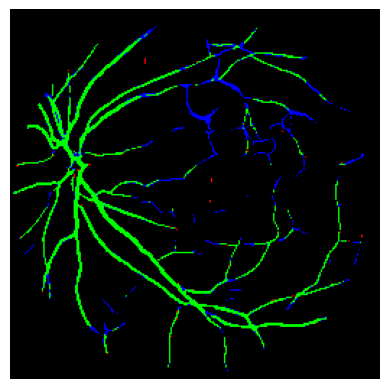

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


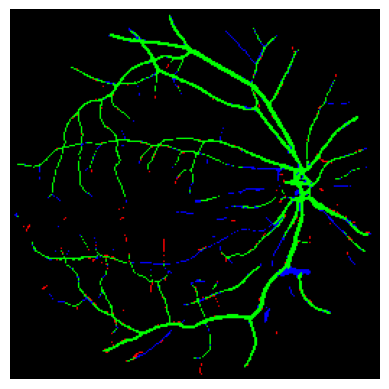

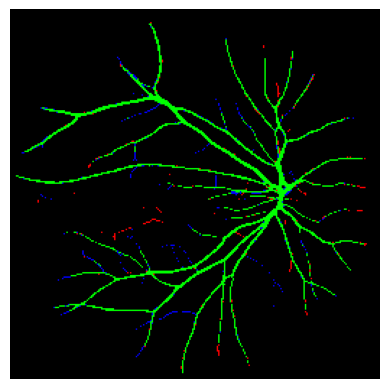

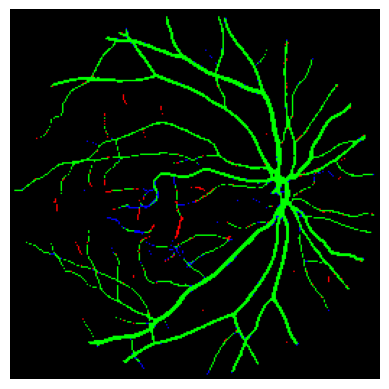

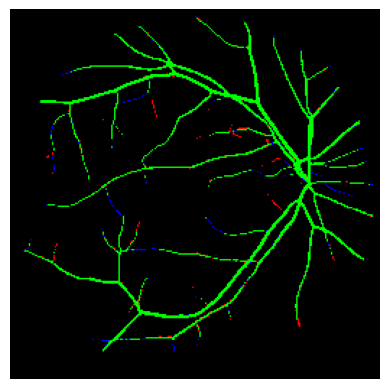

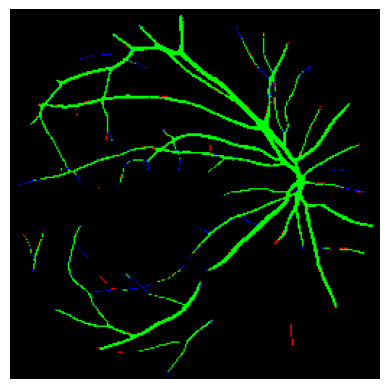

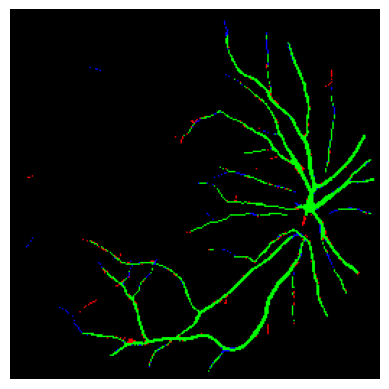

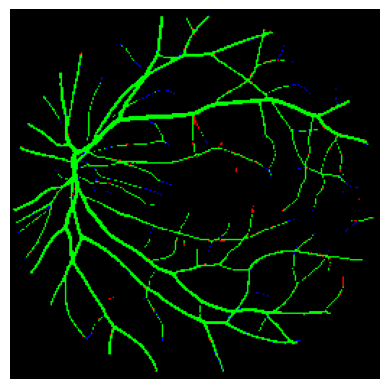

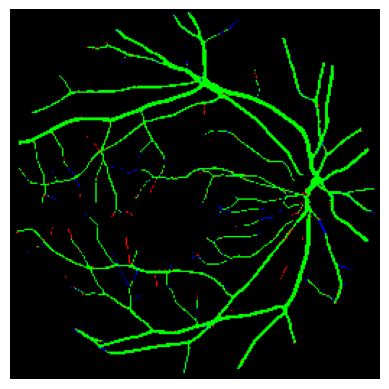

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


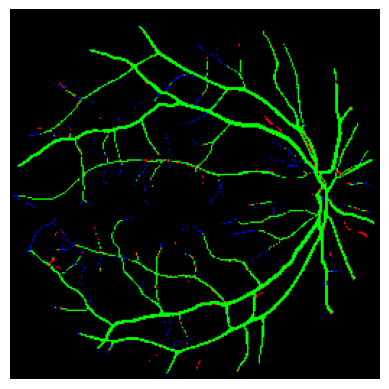

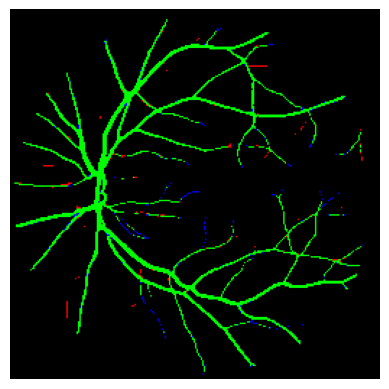

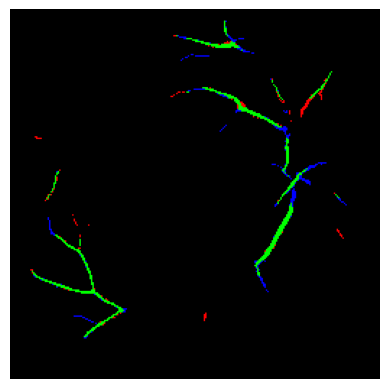

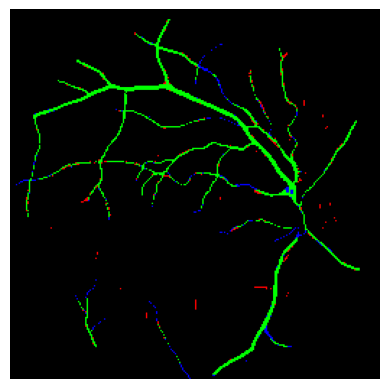

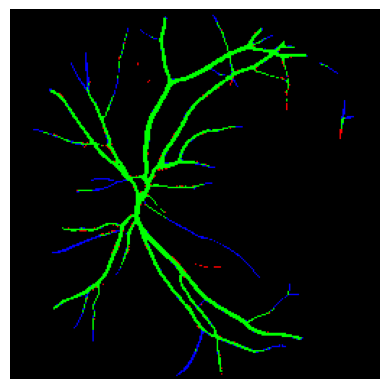

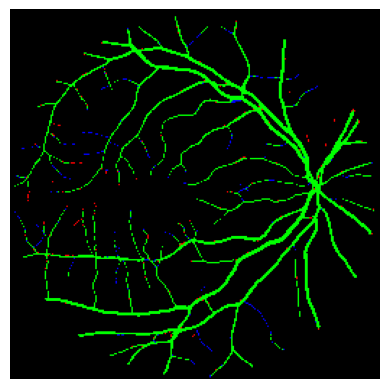

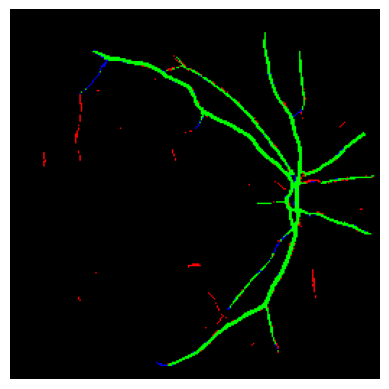

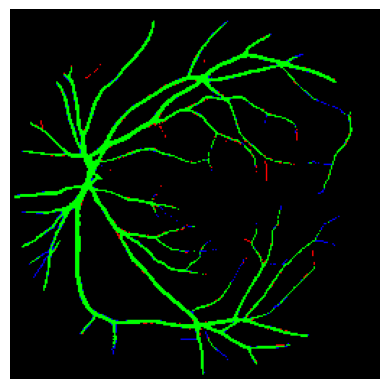

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


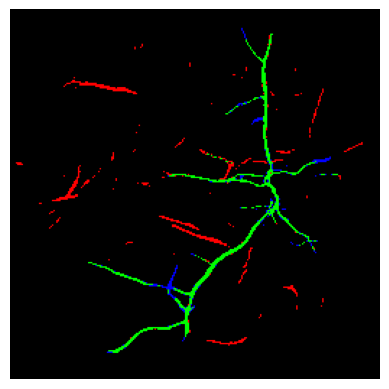

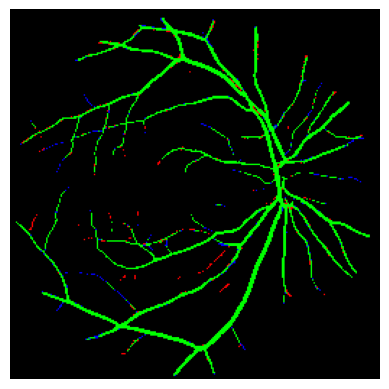

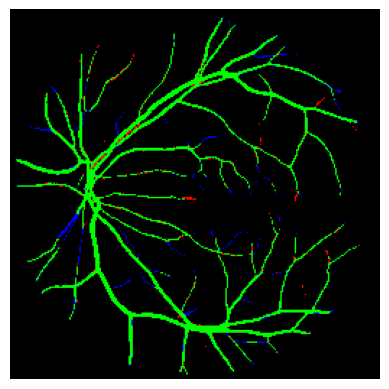

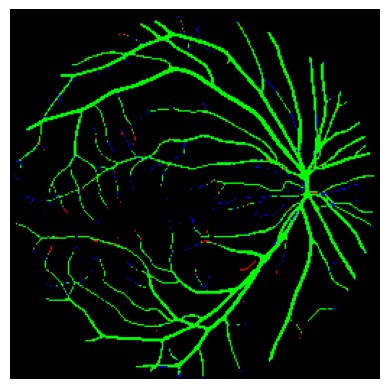

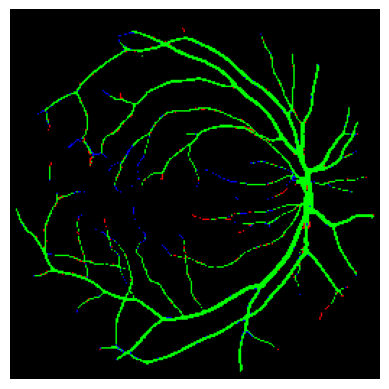

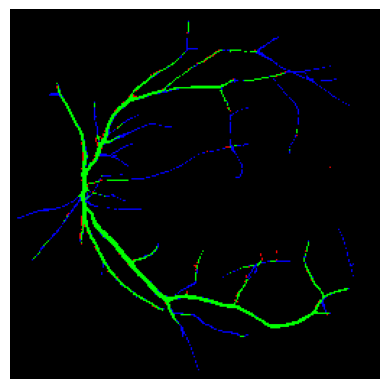

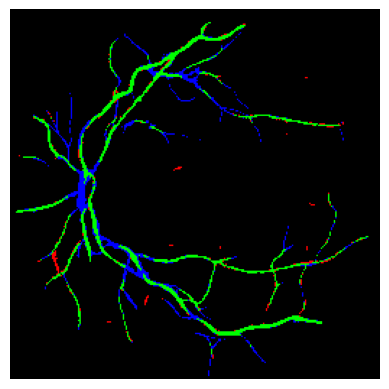

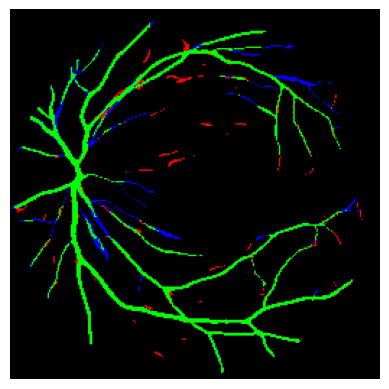

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


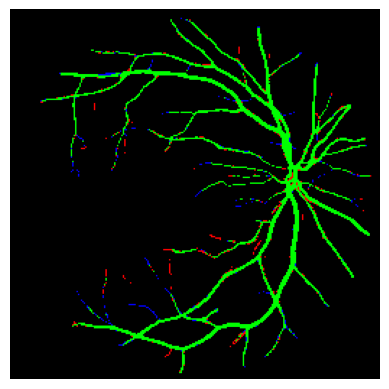

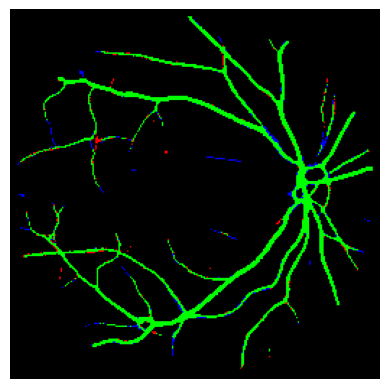

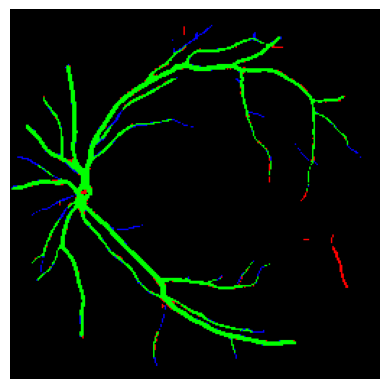

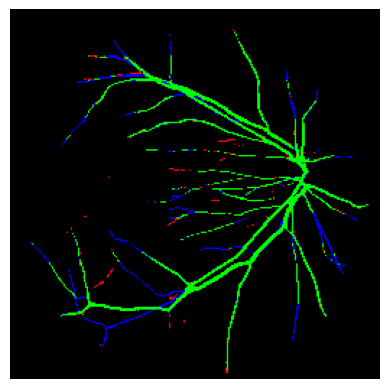

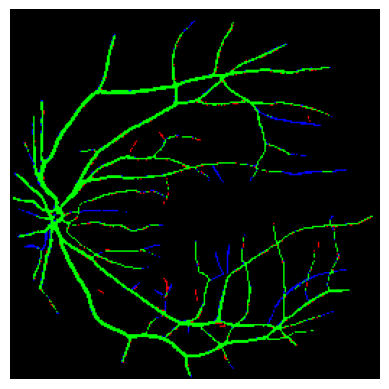

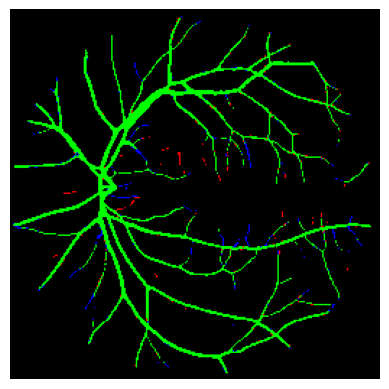

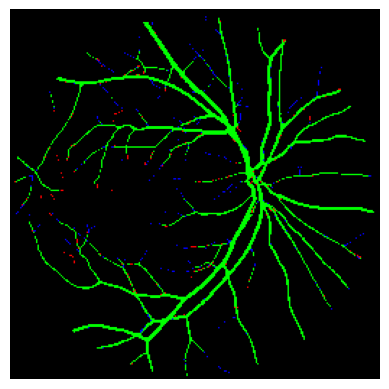

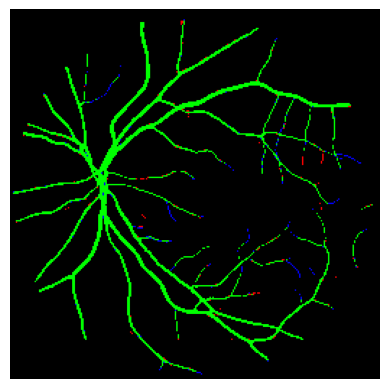

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


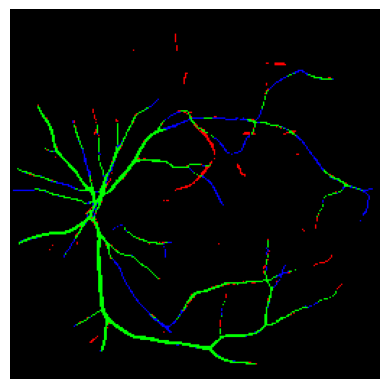

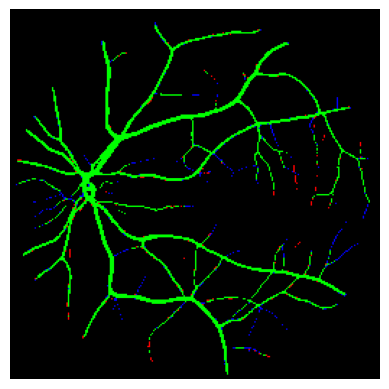

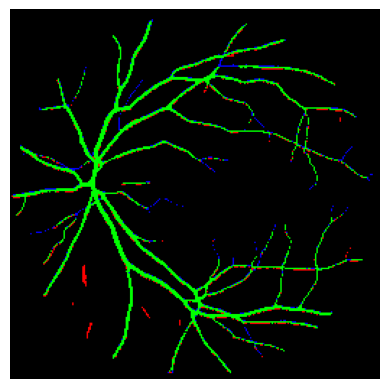

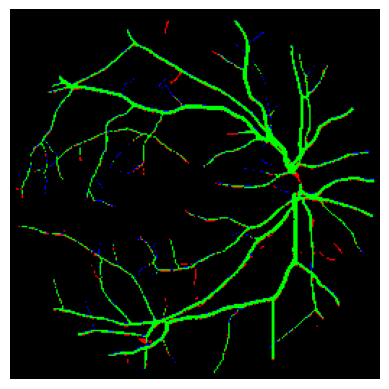

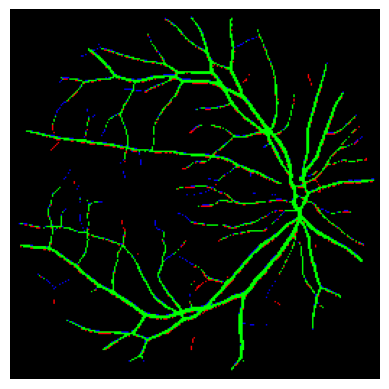

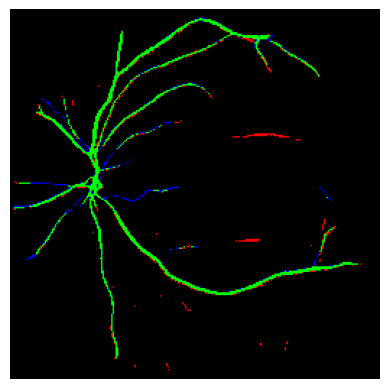

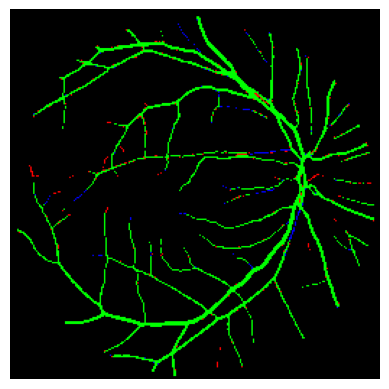

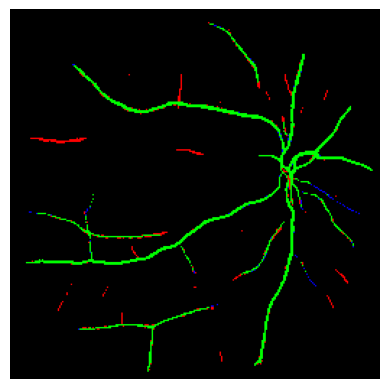

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


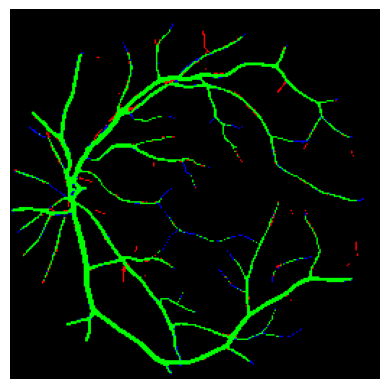

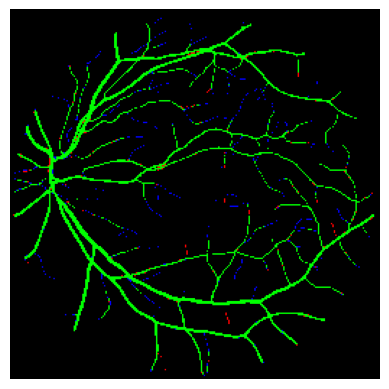

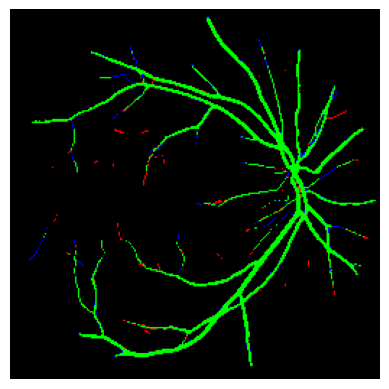

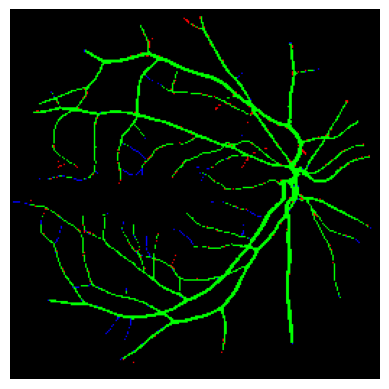

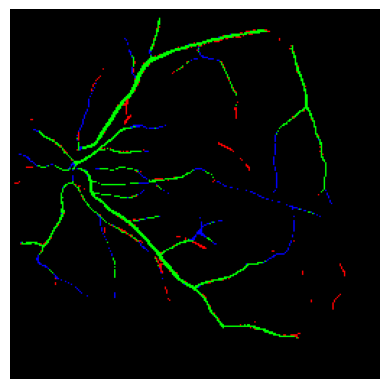

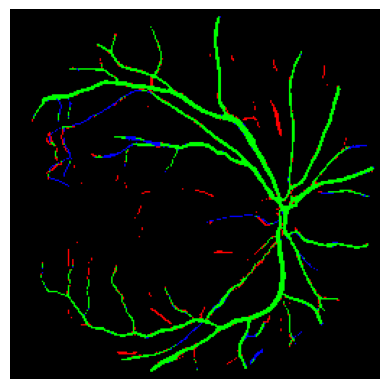

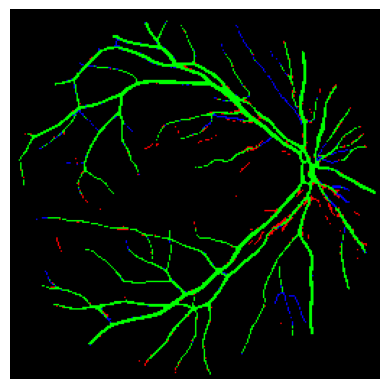

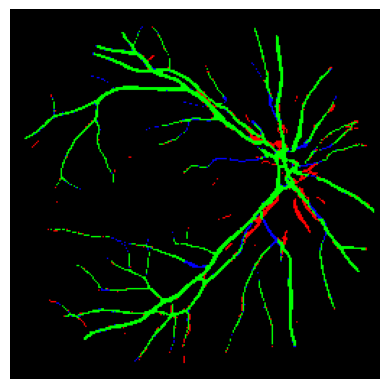

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


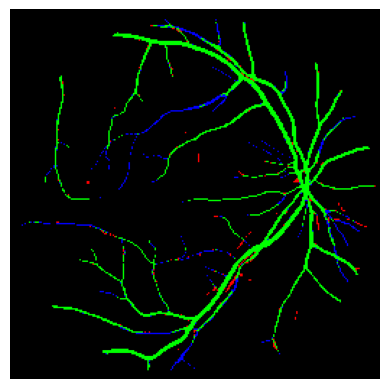

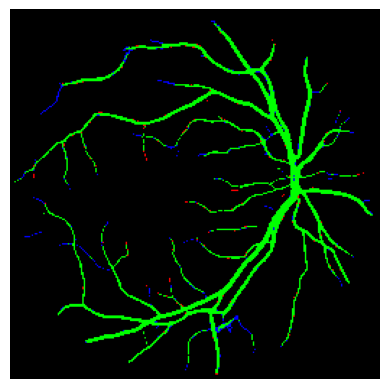

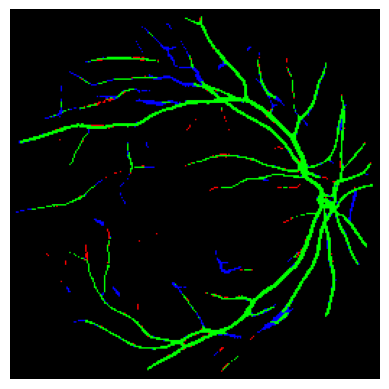

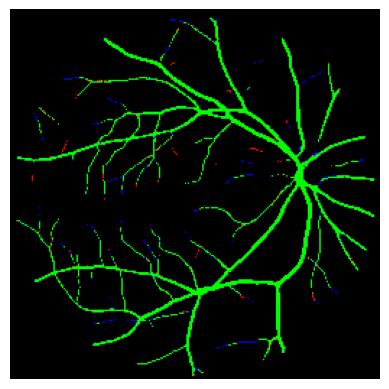

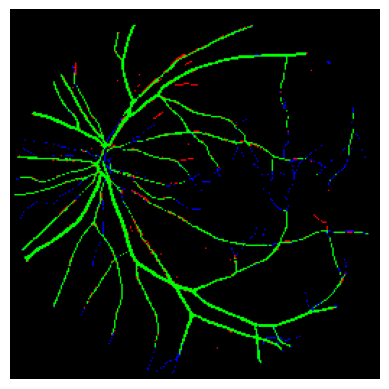

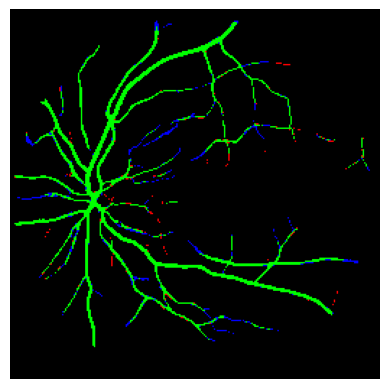

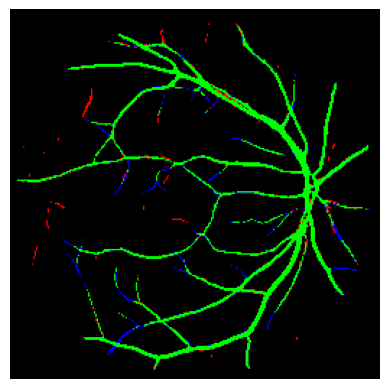

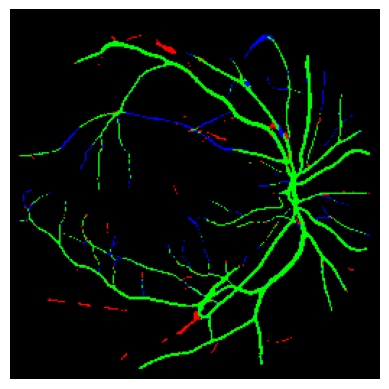

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


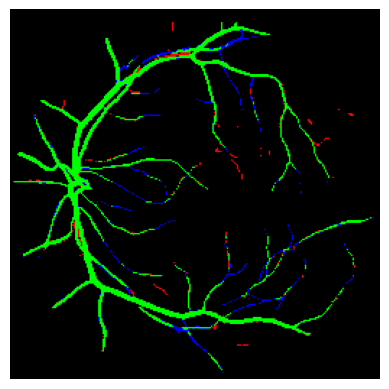

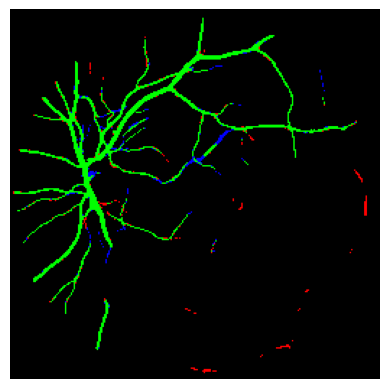

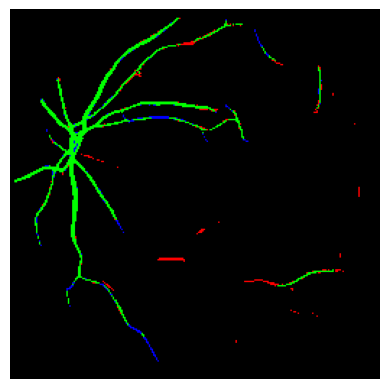

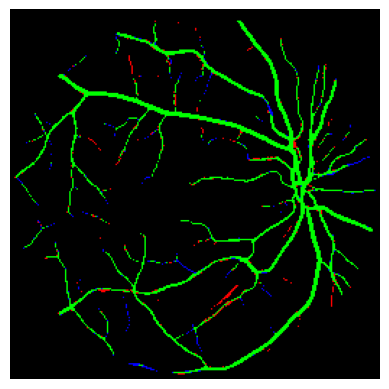

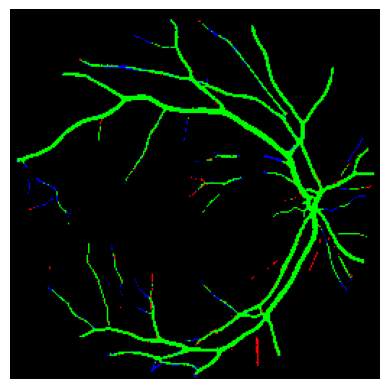

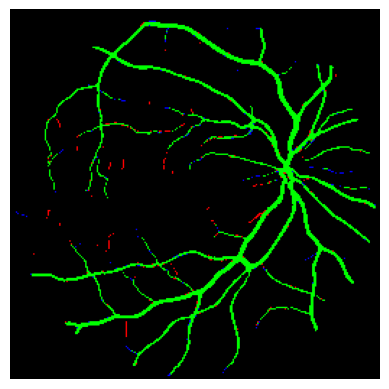

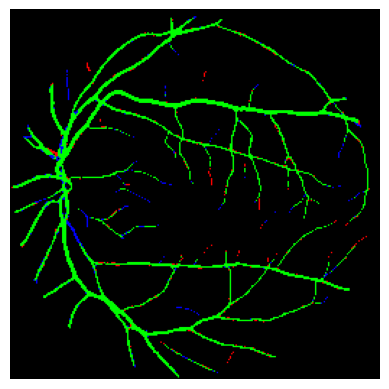

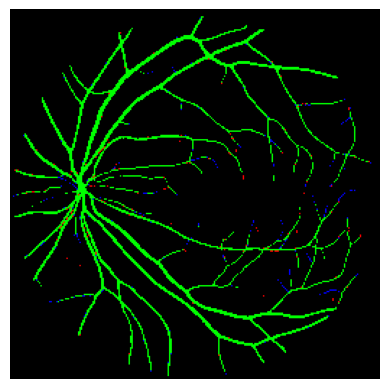

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# true posivies (green), false positives (red), and false negatives (blue)
green = np.array([0, 1, 0])  # Green
red = np.array([1, 0, 0])    # Red
blue = np.array([0, 0, 1])   # Blue

# Create a function to apply the color mapping to the predicted binary mask and plot it
def plot_result_image(image, mask, model):
    # Predict the binary mask for the image using the model
    pred_mask = model.predict(image)

    pred_mask_binary = (pred_mask > 0.5).astype(np.float32)

    batch_size = image.shape[0]

    for i in range(batch_size):
        # Create a mask to visualize matching areas (green), false positives (red), and false negatives (blue)
        match_mask = np.zeros(image[i].shape)

        # where predicted and ground truth masks both equal 1
        match_mask[(pred_mask_binary[i, ..., 0] == 1) & (mask[i, ..., 0] == 1)] = green  # Green (matching)

        # where predicted mask is 1 but ground truth mask is 0
        match_mask[(pred_mask_binary[i, ..., 0] == 1) & (mask[i, ..., 0] == 0)] = red  # Red (false positive)

        # where predicted mask is 0 but ground truth mask is 1
        match_mask[(pred_mask_binary[i, ..., 0] == 0) & (mask[i, ..., 0] == 1)] = blue  # Blue (false negative)


        plt.imshow(match_mask)
        plt.axis('off')
        plt.show()


for image, mask in test_dataset:
    plot_result_image(image, mask, model)

In [20]:
#Test on DRIVE dataset

import os

#Define the paths to the dataset folders

drive_image_folder = '/content/drive/MyDrive/Drive_dataset/Images_png/'
drive_mask_folder = '/content/drive/MyDrive/Drive_dataset/Masks_png'

drive_image_files = os.listdir(drive_image_folder)
drive_mask_files = os.listdir(drive_mask_folder)

drive_image_paths = [os.path.join(drive_image_folder, filename) for filename in drive_image_files]
drive_mask_paths = [os.path.join(drive_mask_folder, filename) for filename in drive_mask_files]

drive_image_paths = sorted(drive_image_paths)
drive_mask_paths = sorted(drive_mask_paths)

import tensorflow as tf

IMAGE_SIZE = 256
BATCH_SIZE = 20

def read_image(image_path, mask=False):
    image = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_png(image, channels=1)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for mask images
        image = tf.where(image >= 0.5, 1.0, 0.0)
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_png(image, channels=3)
        image = tf.cast(image, tf.float32) / 255.0  # Normalize to [0, 1] for RGB images
        image = tf.image.resize(image, [IMAGE_SIZE, IMAGE_SIZE])

    return image

def load_data(image_list, mask_list):
    image = read_image(image_list)
    mask = read_image(mask_list, mask=True)
    return image, mask

def data_generator(image_list, mask_list):
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

drive_dataset = data_generator(drive_image_paths, drive_mask_paths)

print("Test Dataset:", drive_dataset)



Test Dataset: <_BatchDataset element_spec=(TensorSpec(shape=(20, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(20, 256, 256, 1), dtype=tf.float32, name=None))>


In [21]:

def calculate_metrics(model, drive_dataset):
    accuracy_scores = []
    dice_scores = []
    tp_scores = []
    tn_scores = []
    fp_scores = []
    fn_scores = []

    for image, mask in drive_dataset:

        pred_mask = model.predict(image)


        mask = mask.numpy()

        pred_mask_binary = (pred_mask > 0.5).astype(np.float32)

        mask_flat = mask.flatten()
        pred_mask_flat = pred_mask_binary.flatten()

        # Calculate True Positives, True Negatives, False Positives, and False Negatives
        tp = np.sum(mask_flat * pred_mask_flat)
        tn = np.sum((1 - mask_flat) * (1 - pred_mask_flat))
        fp = np.sum((1 - mask_flat) * pred_mask_flat)
        fn = np.sum(mask_flat * (1 - pred_mask_flat))

        # Calculate accuracy, Dice score
        accuracy = (tp + tn) / (tp + tn + fp + fn)
        dice = (2.0 * tp) / (2.0 * tp + fp + fn)

        accuracy_scores.append(accuracy)
        dice_scores.append(dice)
        tp_scores.append(tp)
        tn_scores.append(tn)
        fp_scores.append(fp)
        fn_scores.append(fn)

    # Calculate and print average accuracy and Dice scores
    avg_accuracy = np.mean(accuracy_scores)
    avg_dice = np.mean(dice_scores)

    print(f"Average Accuracy: {avg_accuracy:.4f}")
    print(f"Average Dice Score: {avg_dice:.4f}")

    TP = np.mean(tp_scores)
    TN = np.mean(tn_scores)
    FP = np.mean(fp_scores)
    FN = np.mean(fn_scores)

    f1 = 2 * TP / (2 * TP + FP + FN)
    recall = TP/(FN+TP)
    precision = TP/(TP+FP)
    specificity = TN/(FP+TN)
    MCC = (TP*TN - FP*FN)/ np.sqrt((TP+FP)*(TP+FN)*(TN+FP)*(TN+FN))

    print("Precision Score:", precision)
    print("Sensitivity/Recall Score:", recall)
    print("Specificity Score:", specificity)
    print("F1 Score:", f1)
    print("MCC :", MCC)



calculate_metrics(model, drive_dataset)


1/1 ━━━━━━━━━━━━━━━━━━━━ 46s 46s/step
Average Accuracy: 0.9603
Average Dice Score: 0.7517
Precision Score: 0.8183484
Sensitivity/Recall Score: 0.6950984
Specificity Score: 0.98541784
F1 Score: 0.7517048929826976
MCC : 0.7331881


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


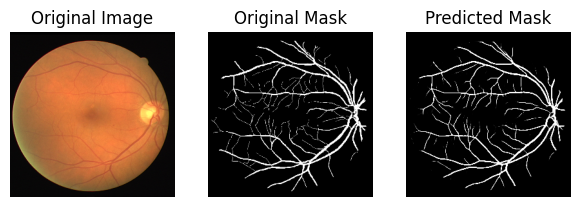

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


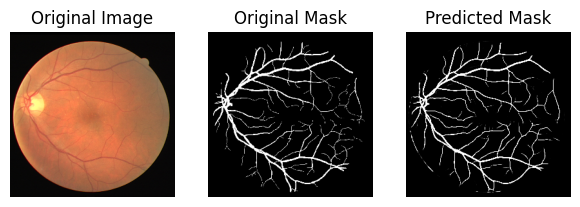

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


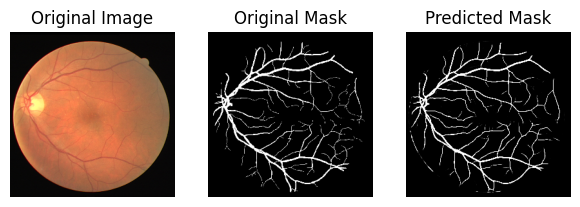

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


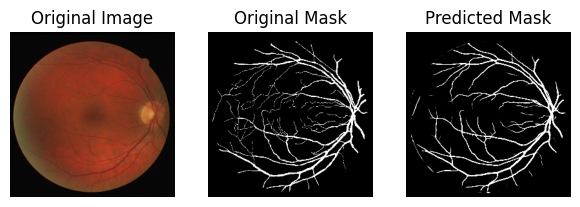

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


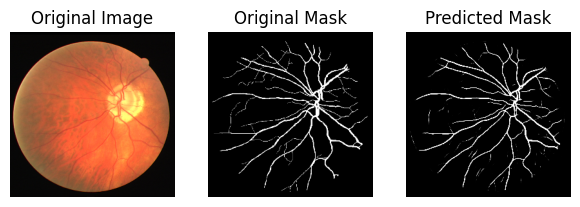

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


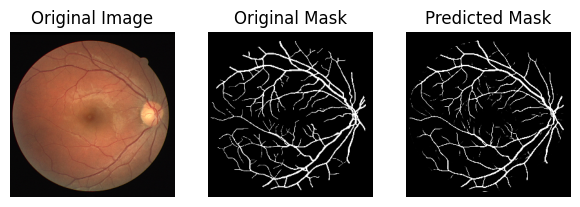

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


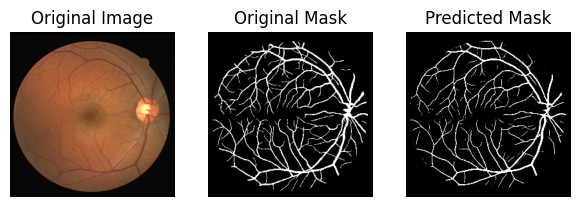

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


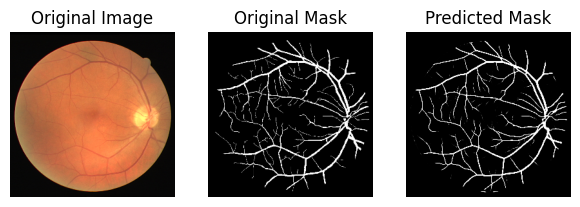

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


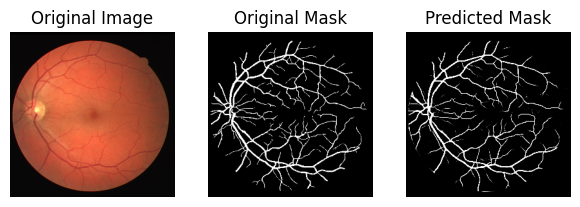

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


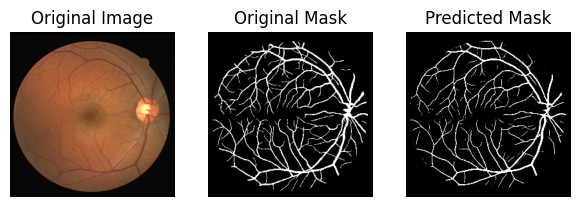

In [22]:
show_images(drive_dataset, model=model, explain=True, n_images=10, SIZE=(20,8))